##### Copyright 2018 The TensorFlow Authors.

In [1]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

In [2]:
#@title MIT License
#
# Copyright (c) 2017 François Chollet
#
# Permission is hereby granted, free of charge, to any person obtaining a
# copy of this software and associated documentation files (the "Software"),
# to deal in the Software without restriction, including without limitation
# the rights to use, copy, modify, merge, publish, distribute, sublicense,
# and/or sell copies of the Software, and to permit persons to whom the
# Software is furnished to do so, subject to the following conditions:
#
# The above copyright notice and this permission notice shall be included in
# all copies or substantial portions of the Software.
#
# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
# IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
# FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL
# THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
# LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING
# FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER
# DEALINGS IN THE SOFTWARE.

# Proj1A - Basic Regression: Understanding the ADNI Data Using Regression  






<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/tutorials/keras/regression"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/keras/regression.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/docs/blob/master/site/en/tutorials/keras/regression.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/docs/site/en/tutorials/keras/regression.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
</table>

## Instructions

Please make a copy and rename it with your name (ex: Proj1A_Ilmi_Yoon). All grading points should be explored in the notebook but some can be done in a separate pdf file. 

*Graded questions will be listed with "Q:" followed by the corresponding points.* 

You will be submitting **a pdf** file containing **the url of your own proj1A.**


---



>[Proj1A - Basic Regression: Understanding the ADNI Data Using Regression](#scrollTo=EIdT9iu_Z4Rb)

>>[1. Load in the Data](#scrollTo=gFh9ne3FZ-On)

>>[2. Clean the Data](#scrollTo=3MWuJTKEDM-f)

>>[3Inspect the Data](#scrollTo=J4ubs136WLNp)

>>[Select a Few Features to Work On and Split Features from Labels](#scrollTo=Db7Auq1yXUvh)

>>[Normalization](#scrollTo=mRklxK5s388r)

>>>[5.1 The Normalization Layer](#scrollTo=aFJ6ISropeoo)

>>[Linear regression](#scrollTo=6o3CrycBXA2s)

>>>[6.1. One Variable](#scrollTo=lFby9n0tnHkw)

>>>[6.2. Multiple Variables (Features)](#scrollTo=Yk2RmlqPoM9u)

>[Extra Credit: A DNN regression](#scrollTo=SmjdzxKzEu1-)

>>[Instructions](#scrollTo=DT_aHPsrzO1t)

>>[A. Train the Model](#scrollTo=ELz48lsgqC46)

>>>[A1. One Variable](#scrollTo=7T4RP1V36gVn)

>>>[A2. Full Model](#scrollTo=S_2Btebp2e64)

>>[B. Performance](#scrollTo=uiCucdPLfMkZ)

>>[C. Make Predictions](#scrollTo=ft603OzXuEZC)

>[Conclusion](#scrollTo=vgGQuV-yqYZH)



## Table of Contents

Introduction (Points: 30 points)
1. Load in the Data
2. Clean the Data
3. Inspect the Data
4. Select a Few Features to Work On and Split Features from Labels
5. Normalization

  5.1 The Normalization Layer

6. Linear Regression

  6.1 One Variable
 
  6.2 Multiple Variable (Features)

A DNN Regression (Extra Credit: 3 points)

1. Instructions
2. A. Train the Model 

  A1. One Variable 
  
  A2. Full Model

3. B. Performance
4. C. Make Predictions

Conclusion

---



## Introduction

In a **regression** problem, the aim is to *predict the output of a continuous value*, like a price or a probability.

Contrast this with a **classification** problem, where the aim is to *select a class from a list of classes* (for example, where a picture contains an apple or an orange, recognizing which fruit is in the picture).

This example uses the `tf.keras API`, see [this guide](https://www.tensorflow.org/guide/keras) for details.

In [3]:
# Use seaborn for pairplot
!pip install -q seaborn

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from IPython.display import display


# Make numpy printouts easier to read.
np.set_printoptions(precision=3, suppress=True)

In [5]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing

print(tf.__version__)

2.6.0


In [6]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
print("Tensorflow version:",tf.__version__)
print()
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

Num GPUs Available:  1
Tensorflow version: 2.6.0

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 12589369687284635316
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 9398714368
locality {
  bus_id: 1
  links {
  }
}
incarnation: 7843817129458247680
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 2080 Ti, pci bus id: 0000:0b:00.0, compute capability: 7.5"
]


### 1. Load in the Data
First download and import the dataset using pandas:

In [7]:
url = "https://raw.githubusercontent.com/pleunipennings/CSC508Data/main/PatData.csv" 

# Load Data
data = pd.read_csv(url)

In [8]:
DATASET = data.copy()
DATASET.tail()

,PTID,AGE,PTGENDER,PTEDUCAT,PTETHCAT,PTRACCAT,PTMARRY,APOE4,DX,Ventricles,Hippocampus,WholeBrain,Entorhinal,Fusiform,MidTemp,ICV
1732,941_S_4377,69.3,Female,12,Not Hisp/Latino,White,Widowed,1.0,MCI,19850.0,6276.500000,854605.0,3098.750000,14773.000000,16232.75,1.307478e+06
1733,941_S_4420,81.4,Male,18,Not Hisp/Latino,White,Married,0.0,MCI,45450.5,7542.250000,1125837.5,4501.750000,16491.250000,17802.75,1.658722e+06
1734,941_S_4764,82.7,Female,20,Not Hisp/Latino,White,Never married,0.0,MCI,63228.5,6092.500000,915772.5,3933.666667,17667.333333,17832.00,1.483815e+06
1735,941_S_5124,76.7,Female,20,Not Hisp/Latino,White,Married,0.0,NL,NaN,4691.666667,NaN,NaN,NaN,NaN,1.489683e+06
1736,941_S_5193,72.5,Female,16,Not Hisp/Latino,White,Married,0.0,NL,22958.5,7009.500000,1026105.0,4007.500000,15812.500000,17461.00,1.465065e+06


In [9]:
DATASET['DX'].value_counts()

MCI                586
Dementia           577
NL                 423
MCI to Dementia    108
NL to MCI           29
NL to Dementia       3
MCI to NL            3
Dementia to MCI      1
Name: DX, dtype: int64

So, I would like to take out everything in the dataset **EXCEPT** the following levels: NL, MCI and Dementia. 

*NL = cognitively normal , MCI = mild cognitive impairement.*

In [10]:
"""
Get the rows that DO NOT have the column DX values as MCI, NL, and Dementia
Remove these rows from the original dataset
"""
index_to_drop = DATASET[(DATASET['DX'] != "MCI") & 
                        (DATASET['DX'] != "NL") & 
                        (DATASET['DX'] != "Dementia")].index
  
# drop these given row indices from data
DATASET = DATASET.drop(index_to_drop)

In [11]:

print("Count for DX Values")
display(DATASET['DX'].value_counts())
print()

print("Dataframe Tail()")
display(DATASET.tail())  # Notice that you now have MCI, Dementia, and NL only

Count for DX Values


MCI         586
Dementia    577
NL          423
Name: DX, dtype: int64


Dataframe Tail()


,PTID,AGE,PTGENDER,PTEDUCAT,PTETHCAT,PTRACCAT,PTMARRY,APOE4,DX,Ventricles,Hippocampus,WholeBrain,Entorhinal,Fusiform,MidTemp,ICV
1732,941_S_4377,69.3,Female,12,Not Hisp/Latino,White,Widowed,1.0,MCI,19850.0,6276.500000,854605.0,3098.750000,14773.000000,16232.75,1.307478e+06
1733,941_S_4420,81.4,Male,18,Not Hisp/Latino,White,Married,0.0,MCI,45450.5,7542.250000,1125837.5,4501.750000,16491.250000,17802.75,1.658722e+06
1734,941_S_4764,82.7,Female,20,Not Hisp/Latino,White,Never married,0.0,MCI,63228.5,6092.500000,915772.5,3933.666667,17667.333333,17832.00,1.483815e+06
1735,941_S_5124,76.7,Female,20,Not Hisp/Latino,White,Married,0.0,NL,NaN,4691.666667,NaN,NaN,NaN,NaN,1.489683e+06
1736,941_S_5193,72.5,Female,16,Not Hisp/Latino,White,Married,0.0,NL,22958.5,7009.500000,1026105.0,4007.500000,15812.500000,17461.00,1.465065e+06


### 2. Clean the Data

The dataset contains a few unknown values. To see how many unknown values, use the following code:

In [12]:
DATASET.isna().sum()  # Count the no value column values

PTID            0
AGE             0
PTGENDER        0
PTEDUCAT        0
PTETHCAT        0
PTRACCAT        0
PTMARRY         0
APOE4           6
DX              0
Ventricles     20
Hippocampus    50
WholeBrain     12
Entorhinal     92
Fusiform       92
MidTemp        92
ICV             1
dtype: int64

Drop those rows to keep this initial tutorial simple.

<p style="color:red; font-size:20px;">Q: **(1 point)** What are other ways to process these rows instead of dropping? </p>

<p style="color:green; font-size:20px;">A: DataFrame.fillna() </p>

In [13]:
DATASET_dropna = DATASET.dropna()
DATASET_fillna = DATASET.fillna(0)


DATASET = DATASET.dropna()  # Remove the rows where a row has a column that contains na from the original dataset
DATASET.isna().sum()




PTID           0
AGE            0
PTGENDER       0
PTEDUCAT       0
PTETHCAT       0
PTRACCAT       0
PTMARRY        0
APOE4          0
DX             0
Ventricles     0
Hippocampus    0
WholeBrain     0
Entorhinal     0
Fusiform       0
MidTemp        0
ICV            0
dtype: int64

Categorical Data needs to be properly handled using one-hot-encoding. 

<p style="color:red; font-size:20px;">Q: **(2 points)** Explain in 200 words what is one-hot-encoding and why it is necessary to handle categorical data.</p>

<p style="color:green; font-size:20px;">A: It's making vectors where each vector has the same amount of components/dimensions and where the value of each component is either 0 or 1. Typically, the amount of components/dimensions is based on the amount of categories and each component/dimension is a category. It is necessary to handle categorical  data because categorical data can be used to group data, so if you wanted to train a model using categorical data, you can potentially get a better result because a group of data might correlate to or be an indicator of something. For example, if you were balding and your relatives were also balding and that you and your relatives were part of a study and that study had genes as a feature, then it's possible that your family members are grouped by a gene that causes balding. </p>

<p style="color:red; font-size:20px;">Q: **(1 point)** Make one more categorical feature into one-hot-encoding </p>

<p style="color:green; font-size:20px;">A: Making the PTMARRY Category into a component in addition to the previous one_hot_data</p>

In [14]:
"""
Basically split a column into it's values and then assign a number to it if value
"""
one_hot_data = pd.get_dummies(
    DATASET, columns=['PTGENDER'], prefix='', prefix_sep='')

# Answer for adding one more category feature into the one-hot-encoding (pseudo one-hot-encoding)
one_hot_data = pd.get_dummies(
    one_hot_data, columns=['PTMARRY'], prefix='', prefix_sep='')

display(one_hot_data.tail())

DATASET = one_hot_data


,PTID,AGE,PTEDUCAT,PTETHCAT,PTRACCAT,APOE4,DX,Ventricles,Hippocampus,WholeBrain,...,Fusiform,MidTemp,ICV,Female,Male,Divorced,Married,Never married,Unknown,Widowed
1730,941_S_4365,80.3,20,Not Hisp/Latino,White,0.0,NL,55885.2,7350.80,1105758.0,...,19869.000000,20101.25,1656876.0,0,1,0,1,0,0,0
1732,941_S_4377,69.3,12,Not Hisp/Latino,White,1.0,MCI,19850.0,6276.50,854605.0,...,14773.000000,16232.75,1307477.5,1,0,0,0,0,0,1
1733,941_S_4420,81.4,18,Not Hisp/Latino,White,0.0,MCI,45450.5,7542.25,1125837.5,...,16491.250000,17802.75,1658722.5,0,1,0,1,0,0,0
1734,941_S_4764,82.7,20,Not Hisp/Latino,White,0.0,MCI,63228.5,6092.50,915772.5,...,17667.333333,17832.00,1483815.0,1,0,0,0,1,0,0
1736,941_S_5193,72.5,16,Not Hisp/Latino,White,0.0,NL,22958.5,7009.50,1026105.0,...,15812.500000,17461.00,1465065.0,1,0,0,1,0,0,0


<p style="color:red; font-size:20px;">Q: **(1 point)** Explain why DX column is mapped to numeric values as below.
</p>

<p style="color:green; font-size:20px;">A: In this particular case, we want a numerical representation of a category's value using integers because we are probably going to use an algorithm that only takes in numbers and not strings.</p>

In [15]:
# Map the row values of the DX column to ints
cleanup_DX = {"DX": {"NL": 1, "MCI": 2, "Dementia": 3}}

DATASET = DATASET.replace(cleanup_DX)

In [16]:
"""
Make the training and testing datasets
"""
train_dataset_main = DATASET.sample(frac=0.8, random_state=0)
test_dataset_main = DATASET.drop(train_dataset_main.index)

### 3. Inspect the Data

Have a quick look at the joint distribution of a few pairs of columns from the training set. *Can you find the data that show their relationship clearly?*

<p style="color:red; font-size:20px;">Q: **(2 points)** Please work with different columns and write what you have learned from the visualization of the data.
</p>

<p style="color:green; font-size:20px;">A: The diagonal subplots are essentially histograms that uses kernels rather than counting similar data points, the more you have of a particular data point, the more kernels you stack on one another. A kernel is the shape that is applied over a data point which is determined by a kernel function. All data points have the same kernel function. The diagonal subplots are also 1 dimensional KDE plots. The non diagonal subplots are 2 dimensional representations of a KDE plot. </p>

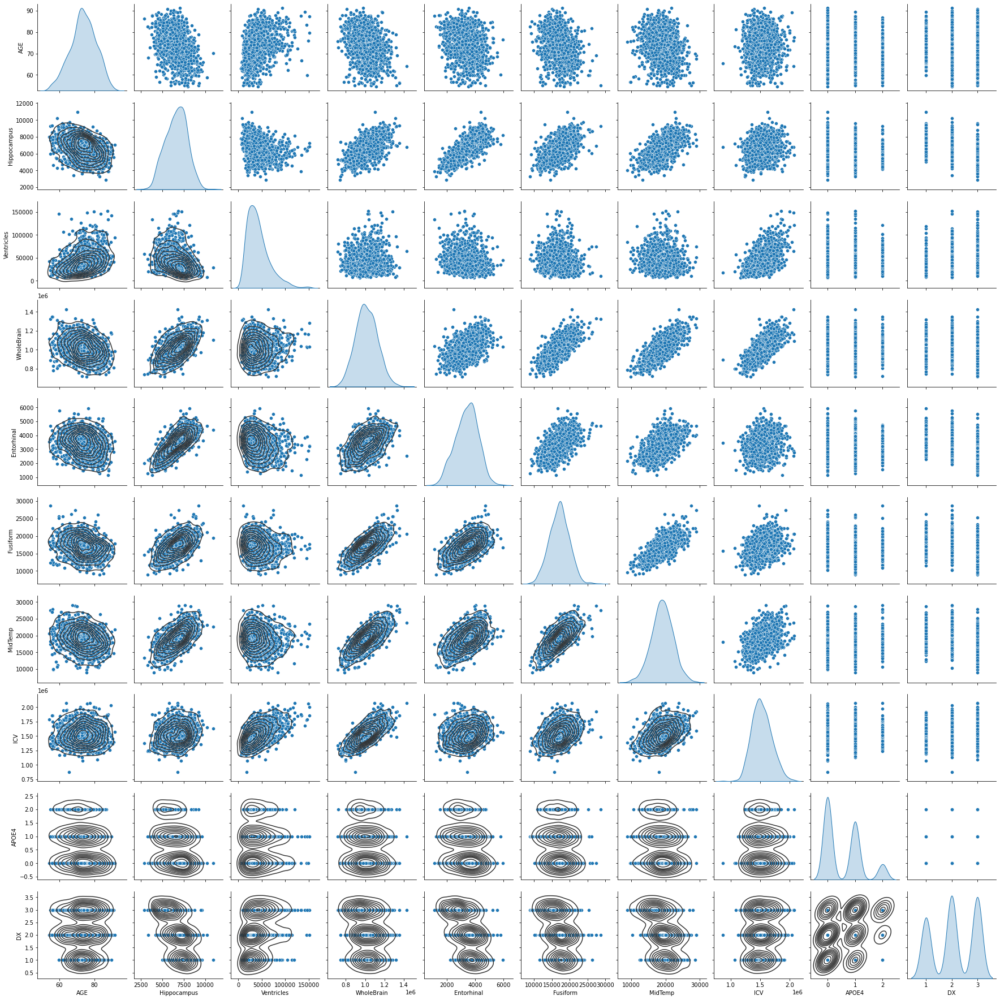

In [17]:
import warnings
warnings.filterwarnings("ignore")

pairplot_train_dataset = sns.pairplot(train_dataset_main[[
    "AGE",
    "Hippocampus",
    "Ventricles",
    "WholeBrain",
    "Entorhinal",
    "Fusiform",
    "MidTemp",
    "ICV",
    "APOE4",
    "DX"
]], diag_kind="kde")

# display(pairplot_train_dataset)
display(pairplot_train_dataset.map_lower(sns.kdeplot, level=10, color=".2"))

# warnings.filterwarnings("default")

Also look at the overall statistics, note how each feature covers a very different range:

In [18]:
train_dataset_main.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
AGE,1183.0,7.354328e+01,7.186444,54.400000,6.910000e+01,7.360000e+01,7.850000e+01,9.140000e+01
PTEDUCAT,1183.0,1.592899e+01,2.878245,4.000000,1.400000e+01,1.600000e+01,1.800000e+01,2.000000e+01
APOE4,1183.0,5.714286e-01,0.666908,0.000000,0.000000e+00,0.000000e+00,1.000000e+00,2.000000e+00
DX,1183.0,2.091293e+00,0.790243,1.000000,1.000000e+00,2.000000e+00,3.000000e+00,3.000000e+00
Ventricles,1183.0,4.228182e+04,23852.178487,6069.500000,2.461721e+04,3.727520e+04,5.366138e+04,1.514055e+05
Hippocampus,1183.0,6.631566e+03,1237.390482,2894.500000,5.735750e+03,6.717167e+03,7.537117e+03,1.094188e+04
WholeBrain,1183.0,1.013104e+06,111468.502835,712985.400000,9.358254e+05,1.008554e+06,1.089934e+06,1.425556e+06
Entorhinal,1183.0,3.398071e+03,785.824008,1143.000000,2.874750e+03,3.443000e+03,3.945167e+03,5.931000e+03
Fusiform,1183.0,1.706231e+04,2772.266839,8863.666667,1.520095e+04,1.708750e+04,1.887675e+04,2.863750e+04
MidTemp,1183.0,1.904685e+04,3155.796565,8850.333333,1.705983e+04,1.905550e+04,2.118038e+04,2.902000e+04


The code below allows you to look into different groups of data -- normal patients, mild patients and dimential patients. 

<p style="color:red; font-size:20px;">Q: **(3 points)** Play with the total data and/or each group data and its regression on age, DX, and other columns 
</p>

<p style="color:green; font-size:20px;">A: Sure</p>

In [19]:
"""
Notes:
    NL = cognitively normal, 
    MCI = mild cognitive impairement.
    
    "NL": 1, "MCI": 2, "Dementia": 3
"""

# index_to_drop = train_dataset[(train_dataset['DX'] != 1)].index

# # drop these given row indices from data
# train_dataset = train_dataset.drop(index_to_drop)
# display(train_dataset.describe().transpose())
# display(train_dataset)


class DatasetContainer:
    def __init__(self, df_dataset):
        self.df_dataset = df_dataset

list_dataset_container = []


"""
JOSEPH JUMP HERE 0

Notes:
    The below are for what datasets to use
"""

temp_1 = DatasetContainer(train_dataset_main[(train_dataset_main['DX'] == 1)])
temp_1.name = "NL"
temp_1.index = 0
list_dataset_container.append(temp_1)

# temp_2 = DatasetContainer(train_dataset_main[(train_dataset_main['DX'] == 2)])
# temp_2.name = "MCI"
# temp_2.index = 1
# list_dataset_container.append(temp_2)

temp_3 = DatasetContainer(train_dataset_main[(train_dataset_main['DX'] == 3)])
temp_3.name = "Dementia"
temp_3.index = 2
list_dataset_container.append(temp_3)

for dataset_container in list_dataset_container:
    print(dataset_container.name)
    display(dataset_container.df_dataset)


NL


,PTID,AGE,PTEDUCAT,PTETHCAT,PTRACCAT,APOE4,DX,Ventricles,Hippocampus,WholeBrain,...,Fusiform,MidTemp,ICV,Female,Male,Divorced,Married,Never married,Unknown,Widowed
1241,100_S_1286,75.5,19,Not Hisp/Latino,White,0.0,1,50622.166667,8380.833333,1.078902e+06,...,15249.833333,21958.833333,1.738638e+06,1,0,1,0,0,0,0
670,032_S_4348,66.1,17,Not Hisp/Latino,White,2.0,1,17713.000000,7115.500000,9.065760e+05,...,13940.500000,16978.000000,1.291000e+06,1,0,1,0,0,0,0
421,021_S_4254,85.9,12,Not Hisp/Latino,White,0.0,1,33643.333333,5760.000000,8.691884e+05,...,16034.333333,16486.333333,1.294773e+06,1,0,0,0,0,0,1
1063,073_S_0312,82.8,20,Not Hisp/Latino,White,1.0,1,53251.666667,7198.666667,1.040647e+06,...,17931.000000,21635.666667,1.711420e+06,0,1,0,1,0,0,0
1293,116_S_0382,75.5,20,Not Hisp/Latino,White,0.0,1,29972.500000,7087.875000,9.589768e+05,...,17779.250000,19334.625000,1.544691e+06,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1197,099_S_0352,77.0,14,Not Hisp/Latino,White,0.0,1,41493.250000,5223.500000,7.668676e+05,...,14922.000000,15290.666667,1.255754e+06,1,0,0,1,0,0,0
773,036_S_5271,80.4,20,Not Hisp/Latino,White,0.0,1,54314.000000,7895.000000,1.239310e+06,...,23273.000000,23540.000000,1.775380e+06,0,1,0,1,0,0,0
677,032_S_5289,59.7,16,Not Hisp/Latino,White,1.0,1,36658.500000,7842.000000,1.055365e+06,...,16989.000000,24700.500000,1.542355e+06,1,0,0,1,0,0,0
766,036_S_4878,72.9,14,Not Hisp/Latino,Black,0.0,1,21944.666667,7302.000000,8.977874e+05,...,19189.800000,17637.800000,1.277356e+06,1,0,0,1,0,0,0


Dementia


,PTID,AGE,PTEDUCAT,PTETHCAT,PTRACCAT,APOE4,DX,Ventricles,Hippocampus,WholeBrain,...,Fusiform,MidTemp,ICV,Female,Male,Divorced,Married,Never married,Unknown,Widowed
769,036_S_5063,71.5,14,Not Hisp/Latino,White,1.0,3,39378.000000,5283.750000,8.176088e+05,...,13090.500000,12418.250000,1.284760e+06,1,0,0,1,0,0,0
788,037_S_1078,70.6,16,Not Hisp/Latino,White,2.0,3,22536.400000,5717.600000,9.694835e+05,...,17144.300000,18378.100000,1.488574e+06,0,1,0,1,0,0,0
522,024_S_1393,82.5,18,Not Hisp/Latino,White,0.0,3,88407.800000,4152.000000,1.042285e+06,...,15454.000000,13959.000000,1.736190e+06,0,1,0,0,0,0,1
199,011_S_0241,81.8,16,Not Hisp/Latino,Black,0.0,3,58360.142857,4963.000000,8.444469e+05,...,13975.000000,14065.000000,1.503297e+06,0,1,0,0,0,0,1
9,002_S_0954,69.3,14,Not Hisp/Latino,White,1.0,3,11233.250000,5376.333333,8.044992e+05,...,12823.666667,14055.666667,1.234518e+06,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
865,051_S_1123,75.8,16,Not Hisp/Latino,White,1.0,3,17753.285714,6738.285714,8.551141e+05,...,14036.142857,15197.857143,1.330790e+06,1,0,1,0,0,0,0
1356,126_S_0865,73.5,10,Not Hisp/Latino,White,1.0,3,97873.800000,8349.400000,1.243540e+06,...,20349.400000,25148.000000,1.963588e+06,0,1,0,1,0,0,0
1236,100_S_0995,78.5,12,Not Hisp/Latino,White,1.0,3,33003.800000,4624.800000,9.588046e+05,...,16550.200000,18266.600000,1.449420e+06,1,0,0,1,0,0,0
1403,127_S_4500,90.3,13,Not Hisp/Latino,White,0.0,3,53384.800000,6361.200000,9.059626e+05,...,15357.800000,17874.800000,1.365304e+06,1,0,0,0,0,0,1


In [20]:
for i in list_dataset_container:
    print(i.name)
    i.df_dataset_one_hot_data = pd.DataFrame(i.df_dataset, columns=["Female", "Male", "Divorced", "Married", "Never married", "Unknown", "Widowed"])
    display(i.df_dataset_one_hot_data)

NL


,Female,Male,Divorced,Married,Never married,Unknown,Widowed
1241,1,0,1,0,0,0,0
670,1,0,1,0,0,0,0
421,1,0,0,0,0,0,1
1063,0,1,0,1,0,0,0
1293,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...
1197,1,0,0,1,0,0,0
773,0,1,0,1,0,0,0
677,1,0,0,1,0,0,0
766,1,0,0,1,0,0,0


Dementia


,Female,Male,Divorced,Married,Never married,Unknown,Widowed
769,1,0,0,1,0,0,0
788,0,1,0,1,0,0,0
522,0,1,0,0,0,0,1
199,0,1,0,0,0,0,1
9,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...
865,1,0,1,0,0,0,0
1356,0,1,0,1,0,0,0
1236,1,0,0,1,0,0,0
1403,1,0,0,0,0,0,1


In [21]:
for i in list_dataset_container:
    print(i.name)
    pd_peole_stuff_sum = i.df_dataset_one_hot_data.sum(axis=0)
    display(pd_peole_stuff_sum)

NL


Female           174
Male             146
Divorced          34
Married          216
Never married     21
Unknown            1
Widowed           48
dtype: int64

Dementia


Female           180
Male             248
Divorced          21
Married          360
Never married      7
Unknown            0
Widowed           40
dtype: int64

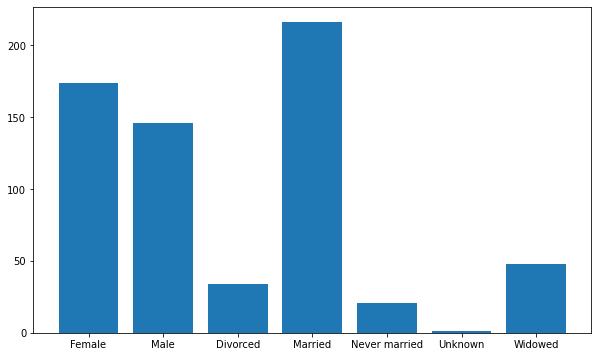

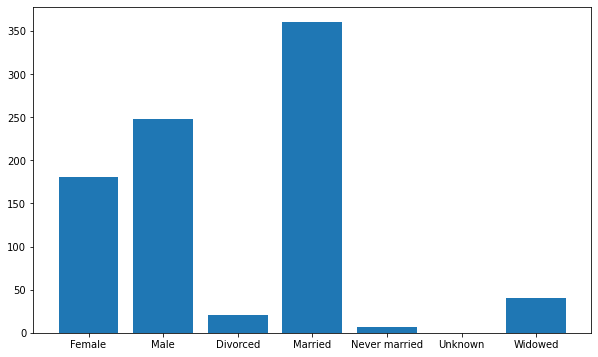

In [22]:
for i in list_dataset_container:
#     print(i.name)
    pd_peole_stuff_sum = i.df_dataset_one_hot_data.sum(axis=0)
    
#     display(pd_peole_stuff_sum.plot.bar(
#         figsize=(10, 5),
#         fontsize=24
#     ))
#     print(list(pd_peole_stuff_sum.keys()))
#     print(list(pd_peole_stuff_sum.values))

    fig = plt.figure(i.index, figsize=(10,6))
    plt.bar(list(pd_peole_stuff_sum.keys()) , list(pd_peole_stuff_sum.values))
#     plt.show()


### 4. Select a Few Features to Work On and Split Features from Labels

Separate the target value (the "label") from the features. **This label is the value that you will train the model to predict.**

In [23]:
"""
JOSEPH JUMP HERE 1

Notes:
    Select what categories to use in the model

"""
def get_quad_data(dataset_given):
    # Important for below questions
    TRAIN_FEATURES = dataset_given[[
        "Ventricles",
        "Hippocampus",
        "WholeBrain",
#         "Entorhinal",
#         "Fusiform",
#         "MidTemp",
#         "ICV"
    ]]
    TEST_FEATURES = dataset_given[[
        "Ventricles",
        "Hippocampus",
        "WholeBrain",
#         "Entorhinal",
#         "Fusiform",
#         "MidTemp",
#         "ICV"
    ]]

    # Important for below questions
    TRAIN_LABELS = dataset_given[[
        "AGE",
#         "PTEDUCAT",  # Not suitable data for correlations
#         "DX",  # Not suitable data for correlations
        "WholeBrain",
#         "Hippocampus",
    ]]
    TEST_LABELS = dataset_given[[
        "AGE",
#         "PTEDUCAT",  # Not suitable data for correlations
#         "DX",  # Not suitable data for correlations
        "WholeBrain",
#         "Hippocampus",
    ]]
    
    return TRAIN_FEATURES, TEST_FEATURES, TRAIN_LABELS, TEST_LABELS

class TrainTestContainer:
    def __init__(self, train_features, test_features, train_labels, test_labels):
        self.train_features = train_features
        self.test_features = test_features
        self.train_labels = train_labels
        self.test_labels = test_labels
        
list_train_test_container = []


for dataset_container in list_dataset_container:
    _temp = TrainTestContainer(*get_quad_data(dataset_container.df_dataset))
    _temp.dataset_container = dataset_container
    
    list_train_test_container.append(_temp)
    print(f"Datasets made for {dataset_container.name}")


Datasets made for NL
Datasets made for Dementia


## 5. Normalization

In the table of statistics it's easy to see how different the ranges of each feature are.

<p style="color:red; font-size:20px;">Q: **(2 points)** Write in 100 words why normalization is important.
</p>

<p style="color:green; font-size:20px;">A: Normalization scales values within a dataset to be within a common range among the other values within the dataset. For example, lets say we have features of a an object that has different ranges, One of the features has a range from 0 to 10000 and another feature has its range from 0 to 1. If we use a machine learning model or linear regression model that incorporates both of those features, the feature with a larger range has more influence on the outcome compared to the smaller range.</p>

*Note*: There is no advantage to normalizing the one-hot features, it is done here for simplicity. For more details on how to use the preprocessing layers, refer the [Working with preprocessing layers](https://www.tensorflow.org/guide/keras/preprocessing_layers) guide and the [Classify structured data using Keras preprocessing layers](https://www.tensorflow.org/tutorials/structured_data/preprocessing_layers) tutorial.

In [24]:
# TRAIN_FEATURES.describe().transpose()[['mean', 'std']]

for train_test_container in list_train_test_container:
    print(train_test_container.dataset_container.name)
    display(train_test_container.train_features.describe().transpose()[['mean', 'std']])


NL


,mean,std
Ventricles,3.315768e+04,17108.432145
Hippocampus,7.396946e+03,893.617120
WholeBrain,1.028703e+06,100214.930766


Dementia


,mean,std
Ventricles,51512.518262,25124.622227
Hippocampus,5733.285366,1070.686018
WholeBrain,977477.515385,116636.577956


### 5.1 The Normalization Layer
The `preprocessing.Normalization` layer is a clean and simple way to build that preprocessing into your model.

The first step is to create the layer:

In [25]:
# normalizer = preprocessing.Normalization(axis=-1)

for train_test_container in list_train_test_container:
    normalizer_features = preprocessing.Normalization(axis=-1)
    train_test_container.normalizer_features = normalizer_features
    

Then `.adapt()` it to the data:

In [26]:
# normalizer.adapt(np.array(TRAIN_FEATURES))

for train_test_container in list_train_test_container:
    np_array_normalizer_features = np.array(train_test_container.train_features)
    train_test_container.normalizer_features.adapt(np_array_normalizer_features)
    

The following code calculates the mean and variance, and stores them in the layer. 

In [27]:
# print(normalizer.mean.numpy())

for train_test_container in list_train_test_container:
    print(train_test_container.dataset_container.name)
    print(train_test_container.normalizer_features.mean.numpy())
    print()

NL
[[  33157.684    7396.946 1028702.56 ]]

Dementia
[[ 51512.523   5733.285 977477.56 ]]



When the layer is called, it returns the input data with each feature independently normalized:

In [28]:
# first = np.array(TRAIN_FEATURES[:1])

# with np.printoptions(precision=2, suppress=True):
#   print('First example:', first)
#   print()
#   print('Normalized:', normalizer(first).numpy())

for train_test_container in list_train_test_container:
    first = np.array(train_test_container.test_features[:1])

    with np.printoptions(precision=2, suppress=True):
        print('First example:', first)
        print()
        print('Normalized:', train_test_container.normalizer_features(first).numpy())
        print("\n")

First example: [[  50622.17    8380.83 1078901.67]]

Normalized: [[1.02 1.1  0.5 ]]


First example: [[ 39378.     5283.75 817608.75]]

Normalized: [[-0.48 -0.42 -1.37]]




## 6. Linear regression

Before building a DNN model, start with a linear regression.

### 6.1. One Variable

Start with a single-variable linear regression, to predict `AGE` from `hippocampus`.

<p style="color:red; font-size:20px;">Q: **(5 points)** Please pick different variable or labels to explore the relationship of the features. 
</p>

<p style="color:green; font-size:20px;">A: Ok i'll do all the TRAIN_FEATURES and TEST_LABELS</p>

Try and show at least 3 different variations.
Training a model with `tf.keras` typically starts by defining the model architecture.

In this case use a `keras.Sequential` model. This model represents a sequence of steps. In this case there are two steps:

* Normalize the input `hippocampus`.
* Apply a linear transformation ($y = mx+b$) to produce 1 output using `layers.Dense`.

The number of _inputs_ can either be set by the `input_shape` argument, or automatically when the model is run for the first time.

First create the hippocampus `Normalization` layer:

In [29]:
"""
JOSEPH JUMP HERE 2

Notes:
    Select which modele variations to use
"""


class DataContainer():
    def __init__(self):
        pass


def model_1_hidden_0_dense_0_activation_none(data_container: DataContainer) -> keras.Sequential:
    feature_model = tf.keras.Sequential()

    feature_model.add(data_container.feature_normalizer)
    
    feature_model.add(layers.Dense(1))

    return feature_model

def model_2_hidden_2_dense_4_activation_relu(data_container: DataContainer) -> keras.Sequential:
    feature_model = tf.keras.Sequential()

    feature_model.add(data_container.feature_normalizer)

    feature_model.add(layers.Dense(4, activation="relu"))  # Additional layer
    feature_model.add(layers.Dense(4, activation="relu"))  # Additional layer

    feature_model.add(layers.Dense(1))

    return feature_model

def model_3_hidden_4_dense_4_activation_relu(data_container: DataContainer) -> keras.Sequential:
    feature_model = tf.keras.Sequential()

    feature_model.add(data_container.feature_normalizer)

    feature_model.add(layers.Dense(4, activation="relu"))  # Additional layer
    feature_model.add(layers.Dense(4, activation="relu"))  # Additional layer
    feature_model.add(layers.Dense(4, activation="relu"))  # Additional layer
    feature_model.add(layers.Dense(4, activation="relu"))  # Additional layer

    feature_model.add(layers.Dense(1))

    return feature_model


def model_4_hidden_2_dense_16_activation_relu(data_container: DataContainer) -> keras.Sequential:
    feature_model = tf.keras.Sequential()

    feature_model.add(data_container.feature_normalizer)

    feature_model.add(layers.Dense(16, activation="relu"))  # Additional layer
    feature_model.add(layers.Dense(16, activation="relu"))  # Additional layer

    feature_model.add(layers.Dense(1))

    return feature_model


def model_5_hidden_4_dense_16_activation_relu(data_container: DataContainer) -> keras.Sequential:
    feature_model = tf.keras.Sequential()

    feature_model.add(data_container.feature_normalizer)

    feature_model.add(layers.Dense(16, activation="relu"))  # Additional layer
    feature_model.add(layers.Dense(16, activation="relu"))  # Additional layer
    feature_model.add(layers.Dense(16, activation="relu"))  # Additional layer
    feature_model.add(layers.Dense(16, activation="relu"))  # Additional layer

    feature_model.add(layers.Dense(1))

    return feature_model


def model_6_hidden_2_dense_64_activation_relu(data_container: DataContainer) -> keras.Sequential:
    feature_model = tf.keras.Sequential()

    feature_model.add(data_container.feature_normalizer)

    feature_model.add(layers.Dense(64, activation="relu"))  # Additional layer
    feature_model.add(layers.Dense(64, activation="relu"))  # Additional layer

    feature_model.add(layers.Dense(1))

    return feature_model


def model_7_hidden_4_dense_64_activation_relu(data_container: DataContainer) -> keras.Sequential:
    feature_model = tf.keras.Sequential()

    feature_model.add(data_container.feature_normalizer)

    feature_model.add(layers.Dense(64, activation="relu"))  # Additional layer
    feature_model.add(layers.Dense(64, activation="relu"))  # Additional layer
    feature_model.add(layers.Dense(64, activation="relu"))  # Additional layer
    feature_model.add(layers.Dense(64, activation="relu"))  # Additional layer

    feature_model.add(layers.Dense(1))

    return feature_model


def model_8_hidden_4_dense_16_activation_selu(data_container: DataContainer) -> keras.Sequential:
    feature_model = tf.keras.Sequential()

    feature_model.add(data_container.feature_normalizer)

    feature_model.add(layers.Dense(16, activation="selu"))  # Additional layer
    feature_model.add(layers.Dense(16, activation="selu"))  # Additional layer
    feature_model.add(layers.Dense(16, activation="selu"))  # Additional layer
    feature_model.add(layers.Dense(16, activation="selu"))  # Additional layer

    feature_model.add(layers.Dense(1))

    return feature_model


def model_9_hidden_2_dense_64_activation_relu(data_container: DataContainer) -> keras.Sequential:
    feature_model = tf.keras.Sequential()

    feature_model.add(data_container.feature_normalizer)

    feature_model.add(layers.Dense(64, activation='relu'))  # Additional layer
    feature_model.add(layers.Dense(64, activation='relu'))  # Additional layer

    feature_model.add(layers.Dense(1))

    return feature_model


list_model_variant = [
    model_1_hidden_0_dense_0_activation_none,
    model_2_hidden_2_dense_4_activation_relu,
#     model_3_hidden_4_dense_4_activation_relu,
#     model_4_hidden_2_dense_16_activation_relu,
#     model_5_hidden_4_dense_16_activation_relu,
#     model_6_hidden_2_dense_64_activation_relu,
    model_7_hidden_4_dense_64_activation_relu,
]

"""
JOSEPH JUMP HERE 3

Notes:
    Select which epochs to use
"""

list_epoch = [
    10,
#     25,
#     50,
    100,
    200,
]

In [30]:
# hippocampus = np.array(TRAIN_FEATURES['Hippocampus'])

# hippocampus_normalizer = preprocessing.Normalization(input_shape=[1,], axis=None)
# hippocampus_normalizer.adapt(hippocampus)

list_dataset_container
list_train_test_container


"""

# Feature/Label -> Model -> Epoch
list_list_list_data_container

"""

# TrainTestContainer (NL), TrainTestContainer (MCI), TrainTestContainer (Dementia) 
for train_test_container in list_train_test_container:
    
    train_test_container.list_list_list_data_container = []
        
    for label_name in train_test_container.train_labels:

        for feature_name in train_test_container.train_features:
            
            list_list_data_container = []
            
            for model_variant in list_model_variant:

                # List of data containers where each item uses a differnt model
                list_data_container = []

                for epoch in list_epoch:

                    data_container = DataContainer()
                    
                    data_container.epoch = epoch
                    
                    data_container.model_name = model_variant.__name__
                
                    data_container.model_variant = model_variant

                    data_container.label_name = label_name

                    data_container.feature_name = feature_name

                    np_array_feature = np.array(train_test_container.train_features[feature_name])

                    data_container.np_array_feature = np_array_feature

                    feature_normalizer = preprocessing.Normalization(input_shape=[1, ], axis=None)  # 1 Input

                    feature_normalizer.adapt(np_array_feature)

                    data_container.feature_normalizer = feature_normalizer

                    list_data_container.append(data_container)

                list_list_data_container.append(list_data_container)
            
            train_test_container.list_list_list_data_container.append(list_list_data_container)

Build the sequential model:

In [31]:
# hippocampus_model = tf.keras.Sequential([
#     hippocampus_normalizer,
#     layers.Dense(units=1)
# ])

# hippocampus_model.summary()


for train_test_container in list_train_test_container:
    
    for list_list_data_container in train_test_container.list_list_list_data_container:
        
        for list_data_container in list_list_data_container:
        
            for data_container in list_data_container:

                feature_model = data_container.model_variant(data_container)

                data_container.name = f"FEATURE_{data_container.feature_name}_LABEL_{data_container.label_name}_MODEL_{data_container.model_name}_DATASET_{train_test_container.dataset_container.name}_EPOCH_{data_container.epoch}"

                feature_model._name = data_container.name

                data_container.feature_model = feature_model

#                 print(feature_model.summary())
#                 print()


This model will predict `AGE` from `hippocampus`.

Run the untrained model on the first 10 horse-power values. The output won't be good, but you'll see that it has the expected shape, `(10,1)`:

In [32]:
# hippocampus_model.predict(hippocampus[:10])

for train_test_container in list_train_test_container:
    
    for list_list_data_container in train_test_container.list_list_list_data_container:
        
        for list_data_container in list_list_data_container:
        
            for data_container in list_data_container:
                print(f"Feature for {data_container.name})")

#                 print(data_container.feature_model.predict(np_array_feature[:10]))
#                 print()

Feature for FEATURE_Ventricles_LABEL_AGE_MODEL_model_1_hidden_0_dense_0_activation_none_DATASET_NL_EPOCH_10)
Feature for FEATURE_Ventricles_LABEL_AGE_MODEL_model_1_hidden_0_dense_0_activation_none_DATASET_NL_EPOCH_100)
Feature for FEATURE_Ventricles_LABEL_AGE_MODEL_model_1_hidden_0_dense_0_activation_none_DATASET_NL_EPOCH_200)
Feature for FEATURE_Ventricles_LABEL_AGE_MODEL_model_2_hidden_2_dense_4_activation_relu_DATASET_NL_EPOCH_10)
Feature for FEATURE_Ventricles_LABEL_AGE_MODEL_model_2_hidden_2_dense_4_activation_relu_DATASET_NL_EPOCH_100)
Feature for FEATURE_Ventricles_LABEL_AGE_MODEL_model_2_hidden_2_dense_4_activation_relu_DATASET_NL_EPOCH_200)
Feature for FEATURE_Ventricles_LABEL_AGE_MODEL_model_7_hidden_4_dense_64_activation_relu_DATASET_NL_EPOCH_10)
Feature for FEATURE_Ventricles_LABEL_AGE_MODEL_model_7_hidden_4_dense_64_activation_relu_DATASET_NL_EPOCH_100)
Feature for FEATURE_Ventricles_LABEL_AGE_MODEL_model_7_hidden_4_dense_64_activation_relu_DATASET_NL_EPOCH_200)
Feature fo

Once the model is built, configure the training procedure using the `Model.compile()` method. The most important arguments to compile are the `loss` and the `optimizer` since these define what will be optimized (`mean_absolute_error`) and how (using the `optimizers.Adam`).

In [33]:
# hippocampus_model.compile(
#     optimizer=tf.optimizers.Adam(learning_rate=0.1),
#     loss='mean_absolute_error')


for train_test_container in list_train_test_container:
    
    for list_list_data_container in train_test_container.list_list_list_data_container:
        
        for list_data_container in list_list_data_container:
        
            for data_container in list_data_container:
            
                data_container.feature_model.compile(
                    optimizer=tf.optimizers.Adam(learning_rate=0.01),
                    loss='mean_absolute_error')

Once the training is configured, use `Model.fit()` to execute the training:

<p style="color:red; font-size:20px;">Q: **(5 points)** Explore different hyperparameters such as learning rate, epochs, batch sizes. Please document your explorations and reflections.
</p>
<p style="color:green; font-size:20px;">A: <br>epochs: [10, 100, 200] <br> learning rate: 0.01,<br> batch sizes: Default because that's what the documentation says "Do not specify the batch_size if your data is in the form of datasets, generators, or keras.utils.Sequence instances (since they generate batches)"<br>
Hidden Layers/Nodes: (There are a lot of different versions I made).<br><br>
Adding more dense layers made the prediction graph's lines more curvy.<br><br>
For the loss graphs, too many epochs probably isn't necessary for models with a lot of layers because the loss drops really fast.<br><br>
In the documentation it says not to change the batch_size for a sequential model.<br><br>
Based on the prediction graphs, the more epochs you have the less hidden layers/nodes you need.<br><br>
In the prediction graphs, if there is no correlation within the data, then you will get a bad curve/line that can't predict anything... (I removed them because they were a waste of time to calculate)<br><br> Too many neurons in a hidden layer leads to overfitting and too little leads to underfitting.                                                                                                                         
</p>

In [34]:
%%time
# history = hippocampus_model.fit(
#     TRAIN_FEATURES['Hippocampus'], train_labels,
#     epochs=100,
#     # suppress logging
#     verbose=1,
#     # Calculate validation results on 20% of the training data
#     validation_split = 0.2)


for train_test_container in list_train_test_container:
        
    for list_list_data_container in train_test_container.list_list_list_data_container:
        
        for list_data_container in list_list_data_container:
        
            for data_container in list_data_container:
                
                history = data_container.feature_model.fit(
                    x=train_test_container.train_features[data_container.feature_name],
                    y=train_test_container.train_labels[data_container.label_name],
                    epochs=data_container.epoch,  # Varies
                    verbose=0,  # 1 to print, 0 to not print # suppress logging
                    validation_split=0.2,  # Calculate validation results on 20% of the training data
                    #         batch_size=None
                )

                print(f"Fitting: {data_container.name}")

                data_container.history = history

Fitting: FEATURE_Ventricles_LABEL_AGE_MODEL_model_1_hidden_0_dense_0_activation_none_DATASET_NL_EPOCH_10
Fitting: FEATURE_Ventricles_LABEL_AGE_MODEL_model_1_hidden_0_dense_0_activation_none_DATASET_NL_EPOCH_100
Fitting: FEATURE_Ventricles_LABEL_AGE_MODEL_model_1_hidden_0_dense_0_activation_none_DATASET_NL_EPOCH_200
Fitting: FEATURE_Ventricles_LABEL_AGE_MODEL_model_2_hidden_2_dense_4_activation_relu_DATASET_NL_EPOCH_10
Fitting: FEATURE_Ventricles_LABEL_AGE_MODEL_model_2_hidden_2_dense_4_activation_relu_DATASET_NL_EPOCH_100
Fitting: FEATURE_Ventricles_LABEL_AGE_MODEL_model_2_hidden_2_dense_4_activation_relu_DATASET_NL_EPOCH_200
Fitting: FEATURE_Ventricles_LABEL_AGE_MODEL_model_7_hidden_4_dense_64_activation_relu_DATASET_NL_EPOCH_10
Fitting: FEATURE_Ventricles_LABEL_AGE_MODEL_model_7_hidden_4_dense_64_activation_relu_DATASET_NL_EPOCH_100
Fitting: FEATURE_Ventricles_LABEL_AGE_MODEL_model_7_hidden_4_dense_64_activation_relu_DATASET_NL_EPOCH_200
Fitting: FEATURE_Hippocampus_LABEL_AGE_MODEL_m

Fitting: FEATURE_WholeBrain_LABEL_AGE_MODEL_model_2_hidden_2_dense_4_activation_relu_DATASET_Dementia_EPOCH_10
Fitting: FEATURE_WholeBrain_LABEL_AGE_MODEL_model_2_hidden_2_dense_4_activation_relu_DATASET_Dementia_EPOCH_100
Fitting: FEATURE_WholeBrain_LABEL_AGE_MODEL_model_2_hidden_2_dense_4_activation_relu_DATASET_Dementia_EPOCH_200
Fitting: FEATURE_WholeBrain_LABEL_AGE_MODEL_model_7_hidden_4_dense_64_activation_relu_DATASET_Dementia_EPOCH_10
Fitting: FEATURE_WholeBrain_LABEL_AGE_MODEL_model_7_hidden_4_dense_64_activation_relu_DATASET_Dementia_EPOCH_100
Fitting: FEATURE_WholeBrain_LABEL_AGE_MODEL_model_7_hidden_4_dense_64_activation_relu_DATASET_Dementia_EPOCH_200
Fitting: FEATURE_Ventricles_LABEL_WholeBrain_MODEL_model_1_hidden_0_dense_0_activation_none_DATASET_Dementia_EPOCH_10
Fitting: FEATURE_Ventricles_LABEL_WholeBrain_MODEL_model_1_hidden_0_dense_0_activation_none_DATASET_Dementia_EPOCH_100
Fitting: FEATURE_Ventricles_LABEL_WholeBrain_MODEL_model_1_hidden_0_dense_0_activation_non

Visualize the model's training progress using the stats stored in the `history` object.

In [35]:
# hist = pd.DataFrame(history.history)
# hist['epoch'] = history.epoch
# hist.tail()

for train_test_container in list_train_test_container:
        
    for list_list_data_container in train_test_container.list_list_list_data_container:
        
        for list_data_container in list_list_data_container:
        
            for data_container in list_data_container:
                hist = pd.DataFrame(data_container.history.history)
                hist['epoch'] = data_container.history.epoch

#                 print(f"{data_container.name}")
#                 display(hist.tail())


In [36]:
# def plot_loss(history):
#   plt.plot(history.history['loss'], label='loss')
#   plt.plot(history.history['val_loss'], label='val_loss')
#   plt.ylim([0, 100])
#   plt.xlabel('Epoch')
#   plt.ylabel('Error [MPG]')
#   plt.legend()
#   plt.grid(True)

def plot_loss(history, index, feature_name):
    plt.figure(index,figsize=(8, 8))
    plt.title(f"{feature_name} loss")
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.ylim([0, 100])
    plt.xlabel('Epoch')
    plt.ylabel('Error [MPG]')
    plt.legend()
    plt.grid(True)

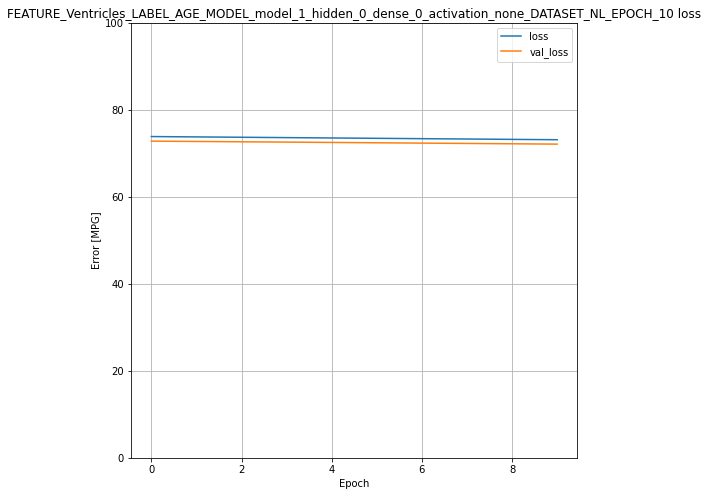

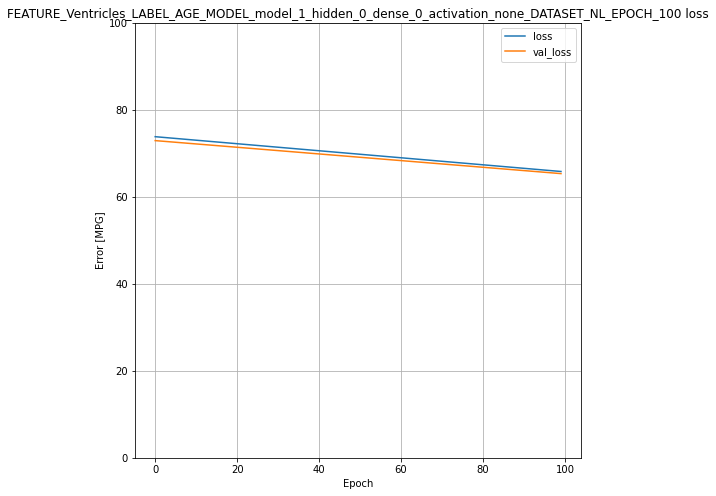

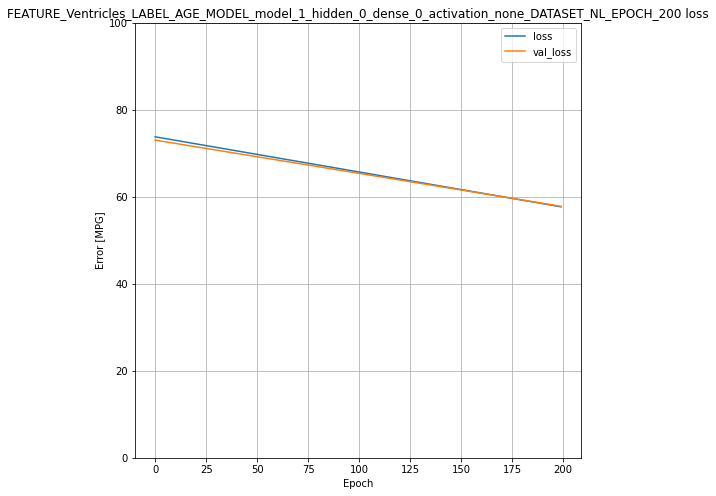

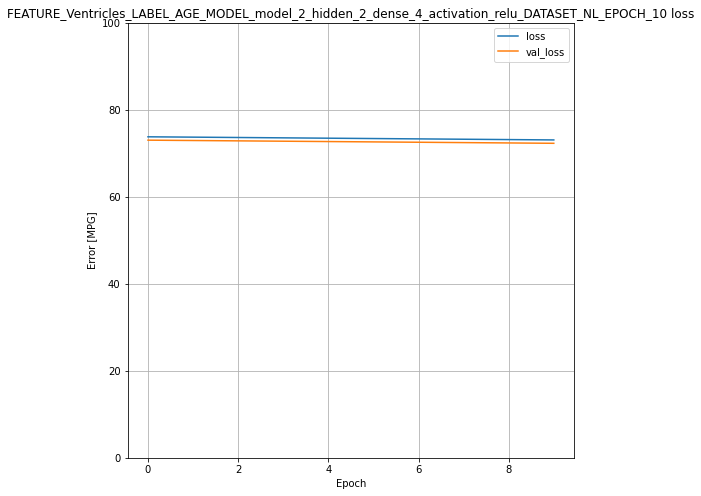

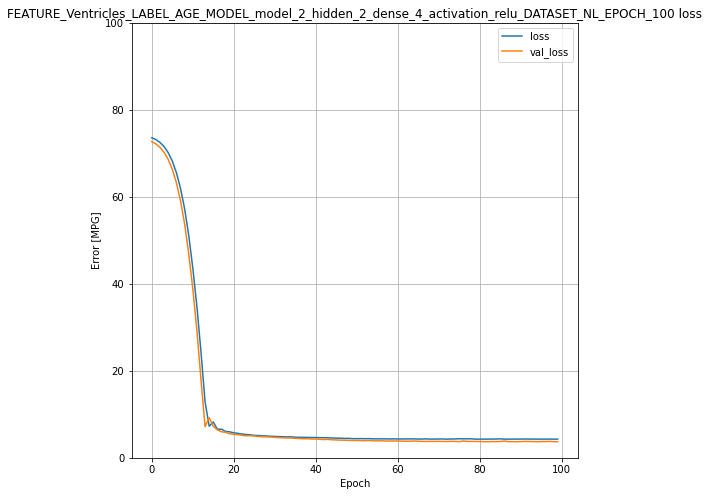

...

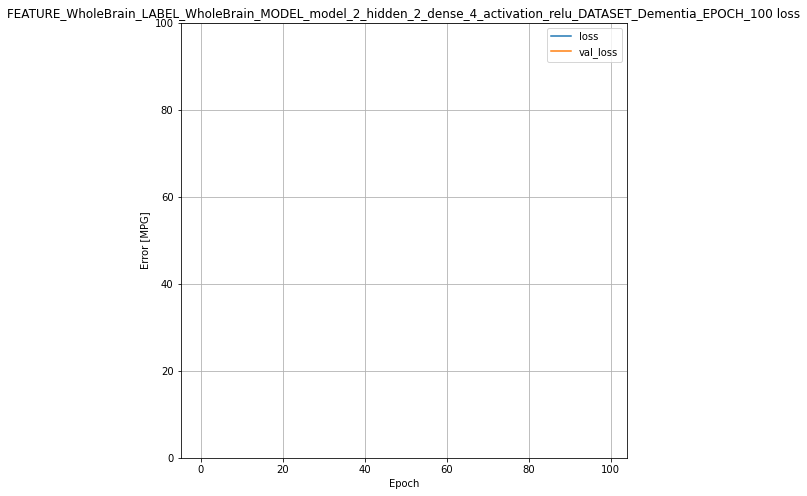

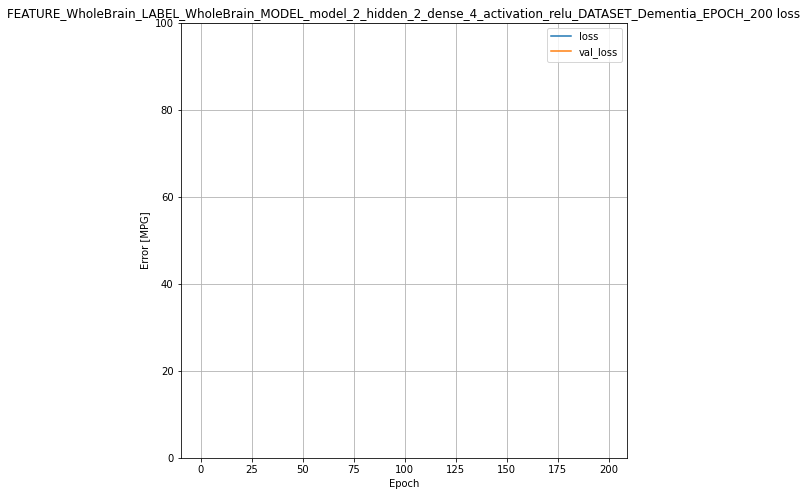

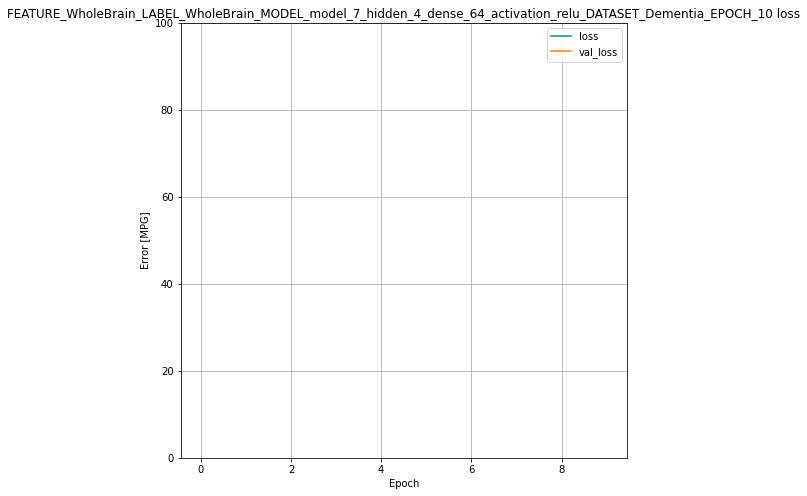

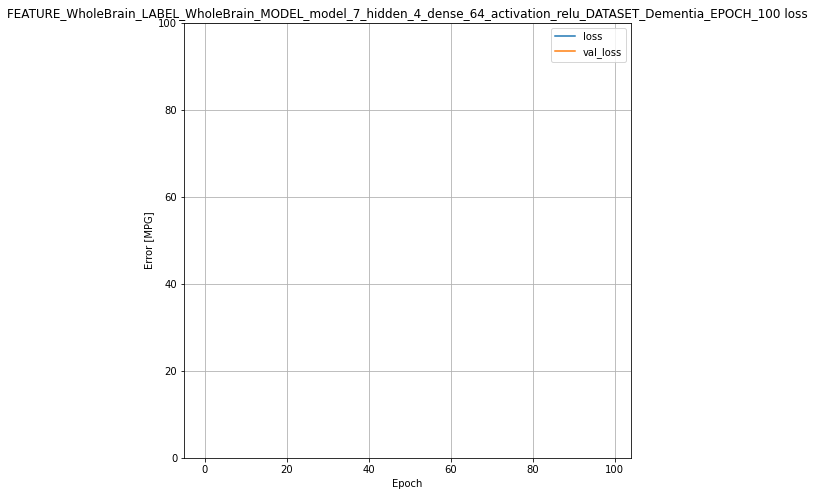

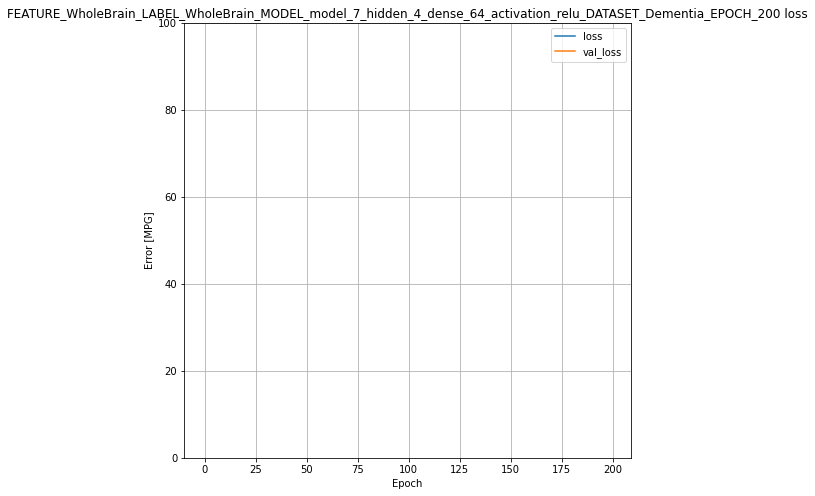

In [37]:
# plot_loss(history)

counter = 0

for train_test_container in list_train_test_container:

    for index, list_list_data_container in enumerate(train_test_container.list_list_list_data_container):

        for list_data_container in list_list_data_container:

            for data_container in list_data_container:

                plot_loss(data_container.history,
                          counter,
                          f"{data_container.name}")
                
                counter += 1

Collect the results on the test set, for later:

In [38]:
test_results = {}

# test_results['hippocampus_model'] = hippocampus_model.evaluate(
#     test_features['Hippocampus'],
#     test_labels, verbose=0)

for train_test_container in list_train_test_container:

    for list_list_data_container in train_test_container.list_list_list_data_container:

        for list_data_container in list_list_data_container:

            for data_container in list_data_container:
                test_results[data_container.feature_model.name] = data_container.feature_model.evaluate(
                    train_test_container.test_features[data_container.feature_name],
                    train_test_container.test_labels[data_container.label_name],
                    verbose=0)

Since this is a single variable regression it's easy to look at the model's predictions as a function of the input:

<p style="color:red; font-size:20px;">Q: **(1 point)** Replace the hard-coded constants with the min & max of this variable to work with other variables without changing it.
</p>
<p style="color:green; font-size:20px;">A: tf.linspace(np.amin(np_array_feature), np.amax(np_array_feature), np_array_feature.size)</p>

In [39]:
# x = tf.linspace(3000, 11000, 100)
# y = hippocampus_model.predict(x)

for train_test_container in list_train_test_container:
        
    for list_list_data_container in train_test_container.list_list_list_data_container:
        
        for list_data_container in list_list_data_container:
        
            for data_container in list_data_container:
                # x = tf.linspace(3000, 11000, 100)
                
                x = tf.linspace(
                    np.amin(data_container.np_array_feature),
                    np.amax(data_container.np_array_feature),
                    data_container.np_array_feature.size)

                y = data_container.feature_model.predict(x)

                data_container.x = x
                data_container.y = y

<p style="color:red; font-size:20px;">Q: **(1 point)** The name of feature 'Hippocampus' and the label 'age' should be replaced as variables, so exploring different variables will be easy without making changes every time. 
</p>
<p style="color:green; font-size:20px;">A: I did all the TRAIN_FEATURES and TRAIN_LABELS</p>

In [40]:
# def plot_hippocampus(x, y):
#   plt.scatter(TRAIN_FEATURES['Hippocampus'], train_labels, label='Data')
#   plt.plot(x, y, color='k', label='Predictions')
#   plt.xlabel('Hippocampus')
#   plt.ylabel('AGE')
#   plt.legend()

def plot_feature(x, y, feature_name_1, feature_name_2, train_features, train_labels, index, text_addition=""):
    plt.figure(index, figsize=(12, 12))
    plt.title(f"{feature_name_2} vs {feature_name_1} {text_addition}")
    plt.scatter(train_features[feature_name_1],
                train_labels[feature_name_2], label='Data')
    plt.xlabel(feature_name_1)
    plt.ylabel(feature_name_2)
    plt.legend()
    plt.plot(x, y, color='k', label='Predictions')

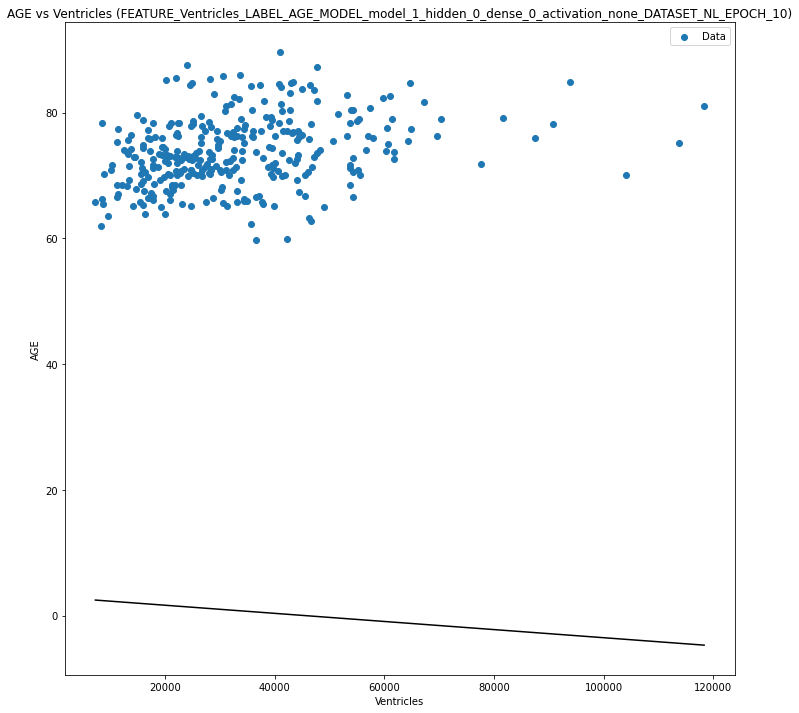

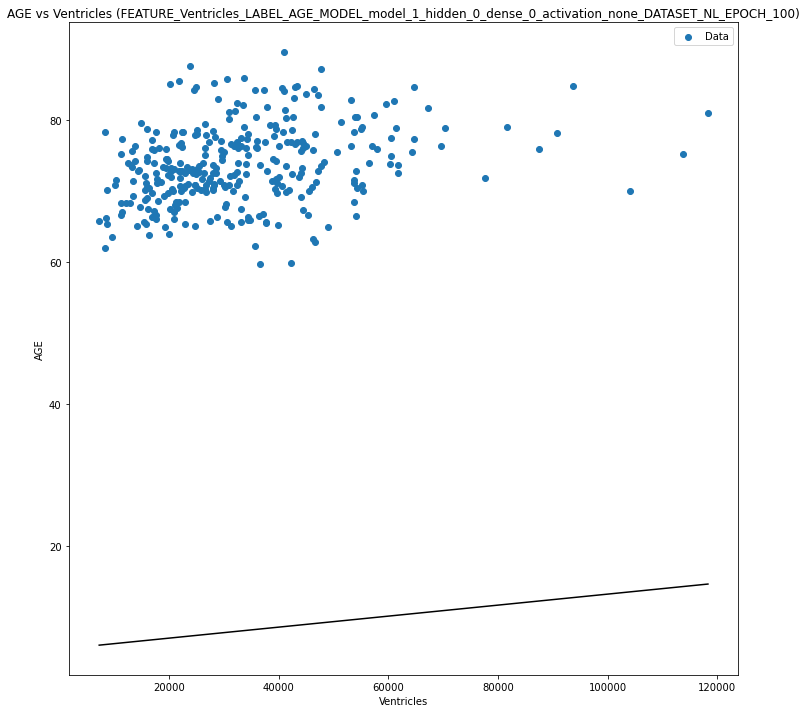

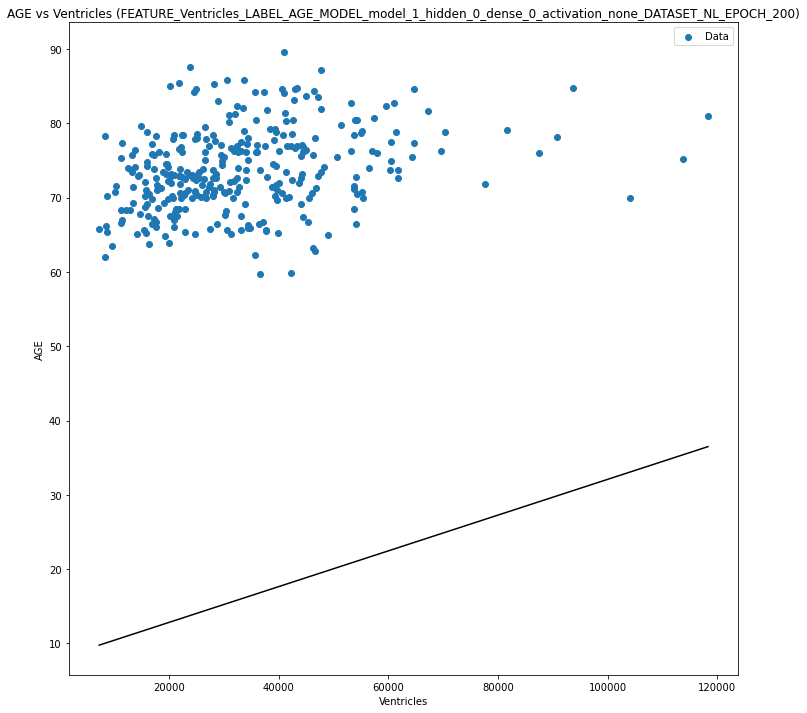

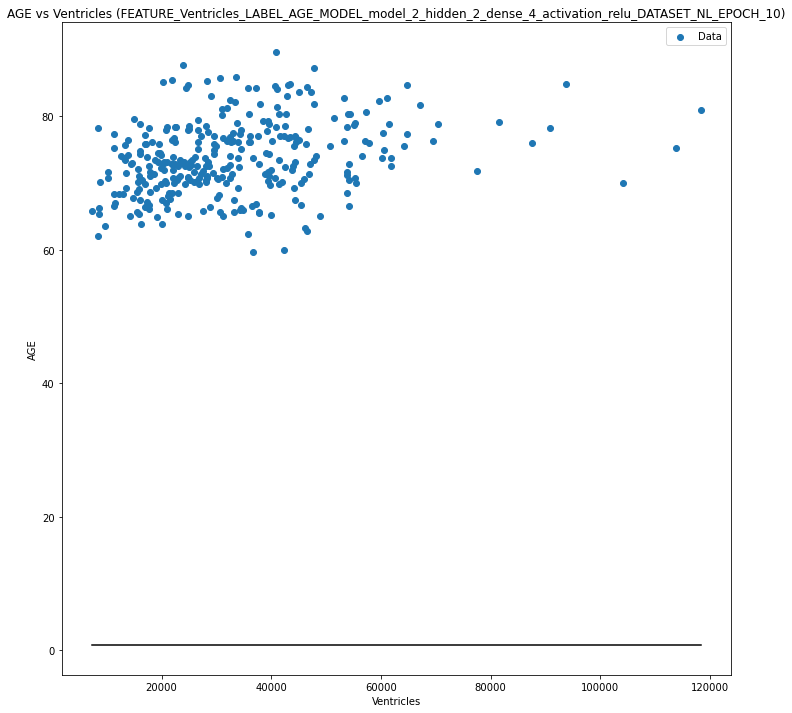

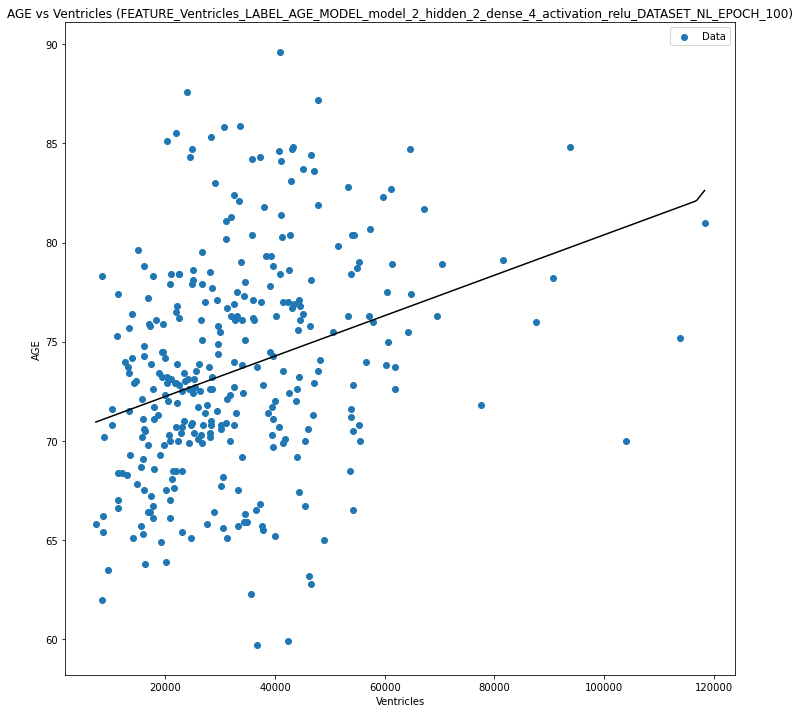

...

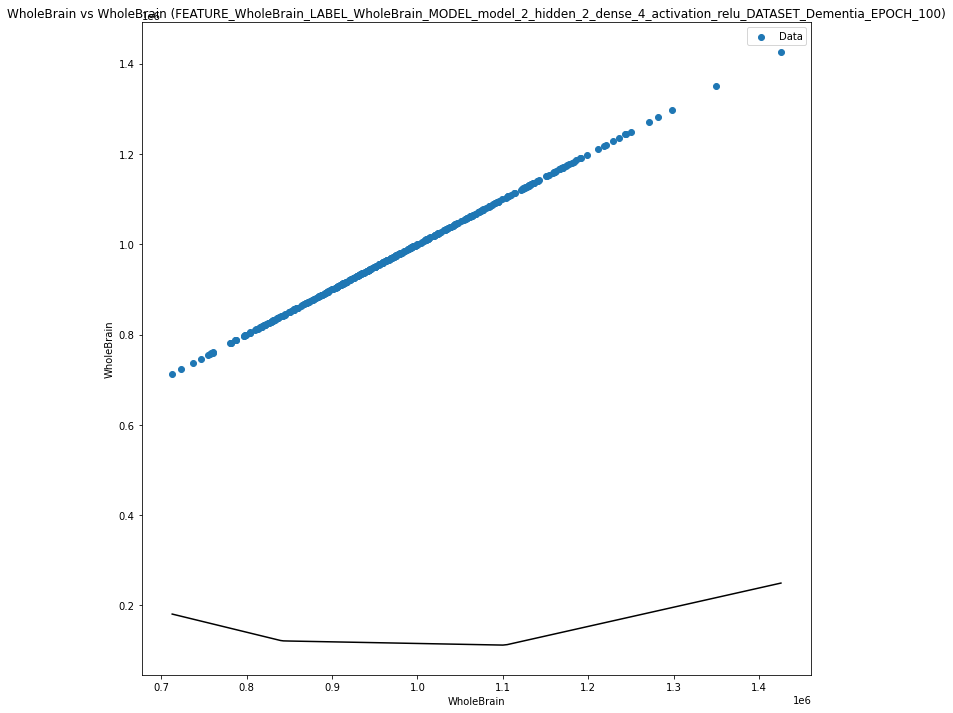

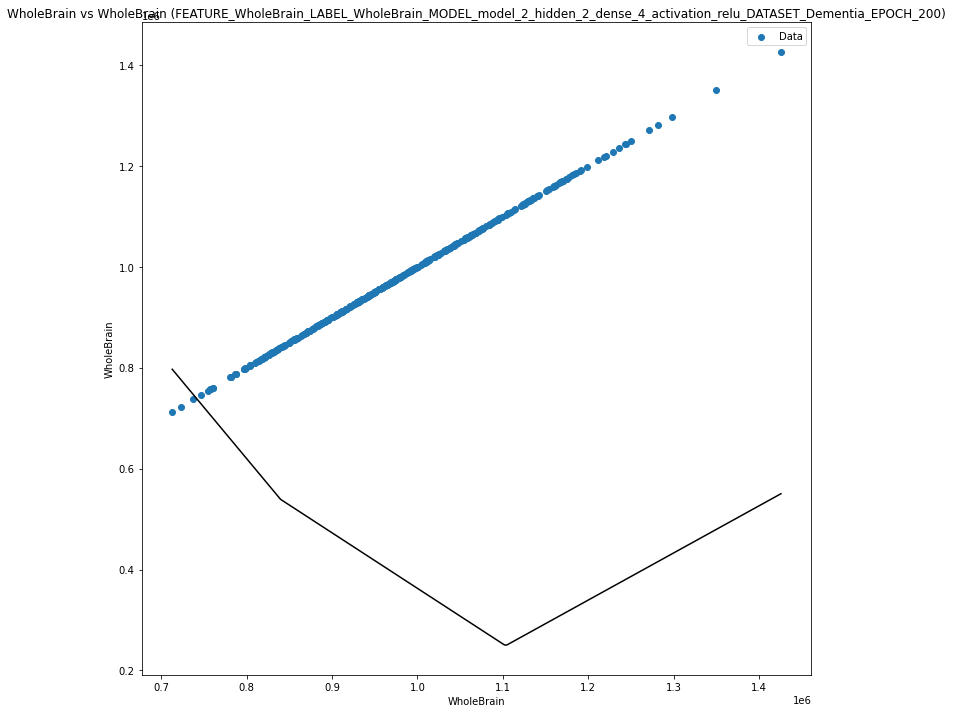

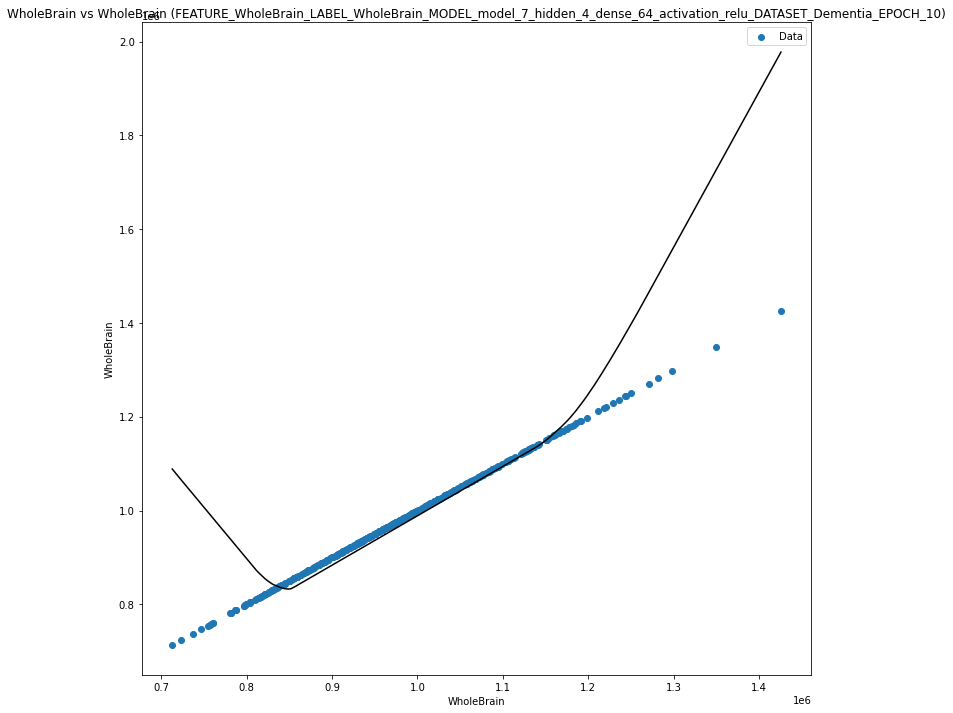

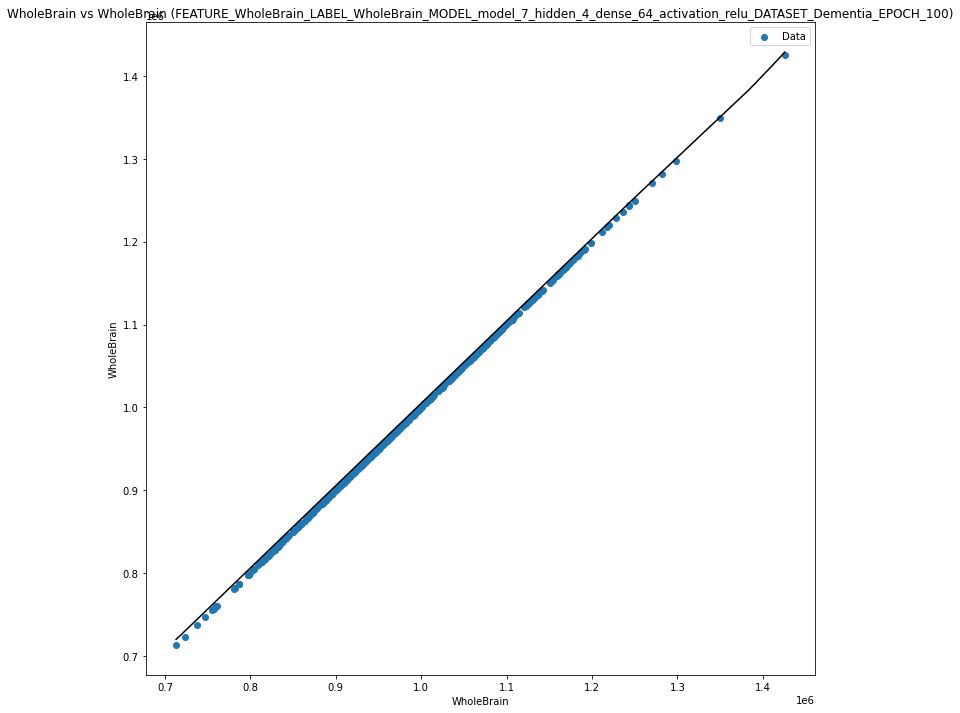

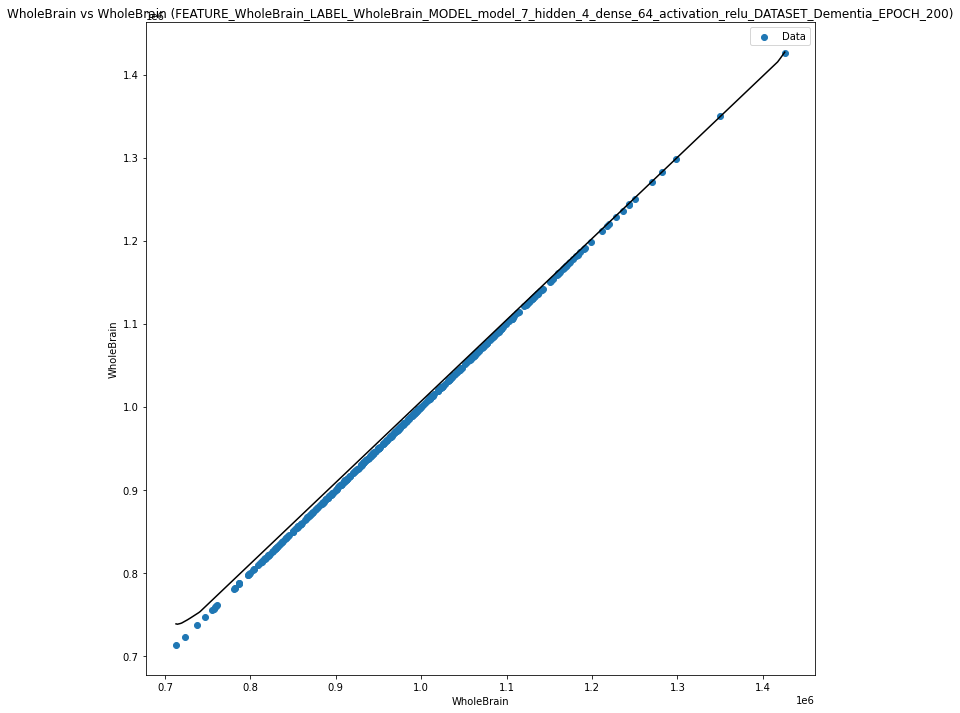

In [41]:
# plot_hippocampus(x,y)

counter = 0

for train_test_container in list_train_test_container:

    for list_list_data_container in train_test_container.list_list_list_data_container:

        for list_data_container in list_list_data_container:

            for data_container in list_data_container:

                plot_feature(data_container.x,
                             data_container.y,
                             data_container.feature_name,
                             data_container.label_name,
                             train_test_container.train_features,
                             train_test_container.train_labels,
                             counter,
                             f"({data_container.name})"
                             )
                counter += 1

### 6.2. Multiple Variables (Features)

You can use an almost identical setup to make predictions based on multiple inputs. This model still does the same $y = mx+b$ except that $m$ is a matrix and $b$ is a vector.

This time use the `Normalization` layer that was adapted to the whole dataset.

In [42]:
TRAIN_FEATURES = list_train_test_container[0].train_features
TRAIN_LABELS = list_train_test_container[0].train_labels
TEST_FEATURES = list_train_test_container[0].test_features
TEST_LABELS = list_train_test_container[0].test_labels

# display(TRAIN_FEATURES, TRAIN_LABLES, TEST_FEATURES, TEST_LABLES)

In [43]:
# linear_model = tf.keras.Sequential([
#     normalizer,
#     layers.Dense(units=1)
# ])

# linear_model.summary()

normalizer_features = preprocessing.Normalization(axis=-1)
np_array_normalizer_features = np.array(TRAIN_FEATURES)
normalizer_features.adapt(np_array_normalizer_features)

linear_model = tf.keras.Sequential([
    normalizer_features,
    layers.Dense(64, activation='relu'),  # Additional Layer
    layers.Dense(64, activation='relu'),  # Additional Layer
    layers.Dense(1)
    #     layers.Dense(units=1)
])

linear_model.summary()

Model: "sequential_108"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
normalization_110 (Normaliza (None, 3)                 7         
_________________________________________________________________
dense_324 (Dense)            (None, 64)                256       
_________________________________________________________________
dense_325 (Dense)            (None, 64)                4160      
_________________________________________________________________
dense_326 (Dense)            (None, 1)                 65        
Total params: 4,488
Trainable params: 4,481
Non-trainable params: 7
_________________________________________________________________


When you call this model on a batch of inputs, it produces `units=1` outputs for each example.

In [44]:
linear_model.predict(TRAIN_FEATURES[:10])

array([[-0.026],
       [-0.03 ],
       [ 0.129],
       [ 0.116],
       [-0.022],
       [-0.194],
       [-0.251],
       [ 0.16 ],
       [-0.04 ],
       [-0.148]], dtype=float32)

When you call the model it's weight matrices will be built. Now you can see that the `kernel` (the $m$ in $y=mx+b$) has a shape of `(9,1)`.

In [45]:
linear_model.layers[1].kernel

<tf.Variable 'dense_324/kernel:0' shape=(3, 64) dtype=float32, numpy=
array([[-0.241, -0.015, -0.235,  0.152,  0.246, -0.152,  0.21 ,  0.04 ,
         0.05 , -0.082, -0.264,  0.173,  0.005, -0.282,  0.246, -0.111,
        -0.187,  0.233, -0.031,  0.095, -0.234,  0.037, -0.197, -0.039,
         0.111,  0.25 ,  0.281,  0.043, -0.067, -0.115, -0.011,  0.002,
        -0.075, -0.076, -0.155, -0.283,  0.261,  0.29 ,  0.161,  0.296,
         0.169,  0.071, -0.018, -0.277,  0.223,  0.133, -0.121,  0.106,
        -0.211,  0.091,  0.297, -0.075,  0.017, -0.188,  0.002, -0.28 ,
        -0.163,  0.02 ,  0.129,  0.27 ,  0.02 ,  0.149, -0.123, -0.15 ],
       [ 0.128, -0.194,  0.106, -0.171, -0.195, -0.136,  0.071, -0.011,
         0.067,  0.128,  0.27 ,  0.007,  0.25 ,  0.02 ,  0.141, -0.057,
        -0.035,  0.098, -0.059, -0.175, -0.224, -0.069,  0.286,  0.123,
         0.143,  0.081,  0.024,  0.233, -0.242,  0.144, -0.097, -0.053,
         0.007, -0.106, -0.296, -0.202,  0.06 , -0.186,  0.162, -

Use the same `compile` and `fit` calls as for the single input `hippocampus` model:

In [46]:
linear_model.compile(
    optimizer=tf.optimizers.Adam(learning_rate=0.1),
    loss='mean_absolute_error')

In [47]:
%%time

history = linear_model.fit(
    TRAIN_FEATURES, 
    TRAIN_LABELS["AGE"],
    epochs=100,
    verbose=0,  # suppress logging
    validation_split=0.2  # Calculate validation results on 20% of the training data
)

Wall time: 4.95 s


Using all the inputs achieves a much lower training and validation error than the `hippocampus` model: 

None

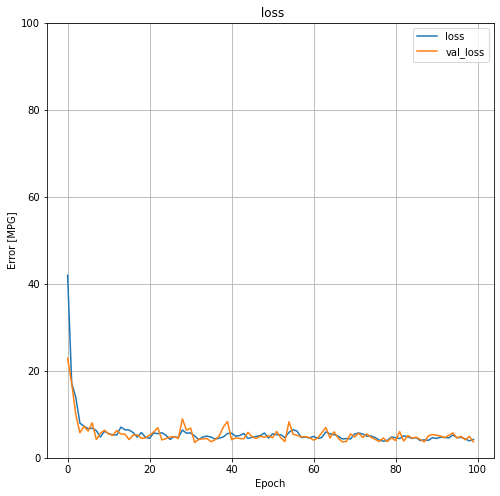

In [48]:
display(plot_loss(history, 0, ""))

None

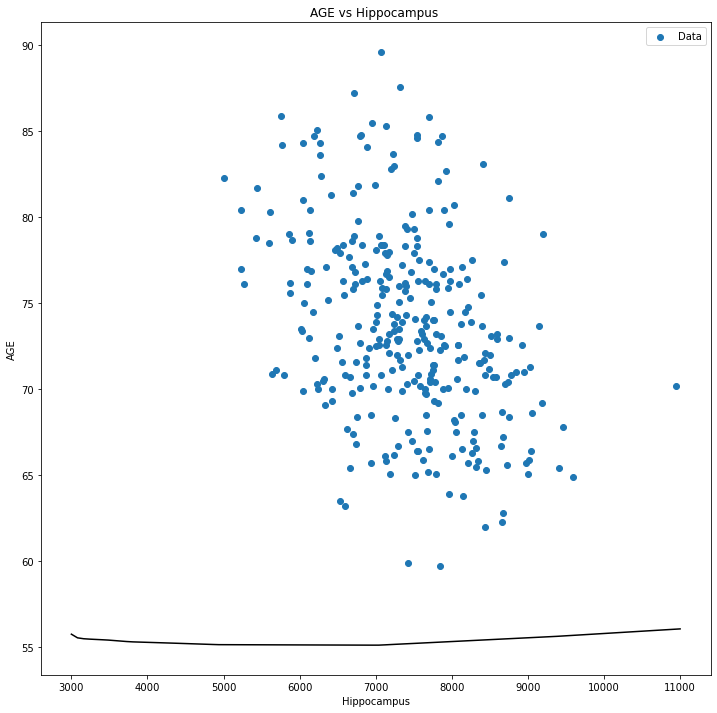

In [49]:
#####
# Off
# x_multi = tf.linspace(
#     np.amin(np_array_normalizer_features),
#     np.amax(np_array_normalizer_features),
#     np_array_normalizer_features.size
# )

x_multi = tf.linspace(3000.0, 11000, 100)

y_milti = tf.convert_to_tensor(linear_model.predict(x_multi))

x_multi_size = x_multi.get_shape()
y_milti_size = y_milti.get_shape()

# print(f"x_multi: {x_multi}")
# print(f"x_multi_size: {x_multi_size}")
# print(f"y_milti_size: {y_milti_size}")
# print()
# print(f"x_multi: {x_multi}")
# print(f"y_milti: {y_milti}")

#####

display(plot_feature(x_multi, 
                     y_milti,
                     "Hippocampus",
                     "AGE", 
                     TRAIN_FEATURES, 
                     TRAIN_LABELS, 
                     0
                    )
       )

Collect the results on the test set, for later:

In [50]:
test_results['linear_model'] = linear_model.evaluate(
    TEST_FEATURES, 
    TEST_LABELS["AGE"],
    verbose=0)

len_test_labels=320
len_test_predictions=320



Text(0, 0.5, 'Predictions [AGE]')

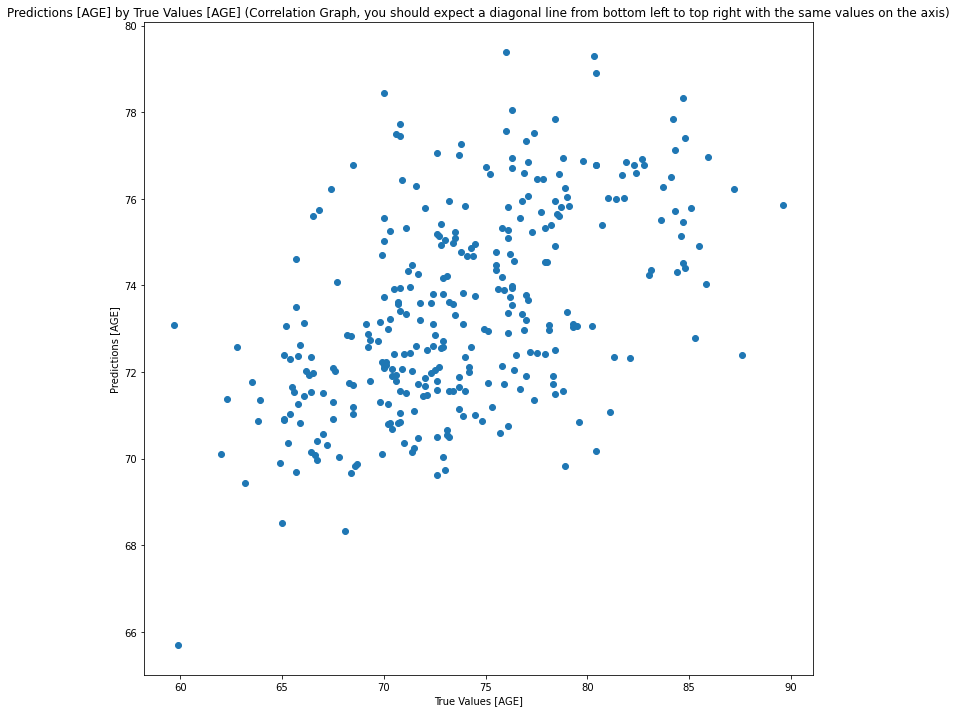

In [51]:
# test_predictions = linear_model.predict(TEST_FEATURES).flatten()

# a = plt.axes(aspect='equal')
# plt.scatter(TEST_LABELS, test_predictions)
# plt.xlabel('True Values [AGE]')
# plt.ylabel('Predictions [AGE]')
# lims = [60, 90]
# plt.xlim(lims)
# plt.ylim(lims)
# _ = plt.plot(lims, lims)

test_predictions = linear_model.predict(TEST_FEATURES).flatten()

#####
len_test_labels = len(TEST_LABELS["AGE"])
print(f"{len_test_labels=}")
len_test_predictions = test_predictions.size
print(f"{len_test_predictions=}")
print()

#####

# a = plt.axes(aspect='equal')
plt.figure(figsize=(12, 12))
plt.title(f"Predictions [AGE] by True Values [AGE] (Correlation Graph, you should expect a diagonal line from bottom left to top right with the same values on the axis)")
plt.scatter(TEST_LABELS["AGE"], test_predictions)
plt.xlabel('True Values [AGE]')
plt.ylabel('Predictions [AGE]')

# lims = [60, 90]
# plt.xlim(lims)
# plt.ylim(lims)
# _ = plt.plot(lims, lims)

# plt.plot(x_multi, y_milti, color='k', label='Predictions')


<p style="color:red; font-size:20px;">Q: **(6 points)** Explore different features as TRAIN_FEATURES and TRAIN_LABELS and see what relationship help you understand the ADNI data set better. Show that you explored at least 3 different combinations of features and label and write your reflection in 200 words or more
</p>
<p style="color:green; font-size:20px;">A: I used all of the items from TRAIN_FEATURES and TRAIN_LABELS, but it looks like the data from the dataset isn't really helpful for finding correlations. For example, if you look at the above graph, the age from the actual data and the age predicted by the model does not match which implies that given all those features, the model could not determine if age is a strong indication of getting Alzheimer's disease (I think that's what the dataset is). Also, if you look at the prediction graphs, you can see that most of them suck because my models need to be fine tuned for the specific feature and label given. Plus, I don't really know what is the best combination of hidden layers and nodes I need to train each feature and label pair.<br><br>
I literally spent hours guessing and testing what I should put in for the amount of layers and nodes I need, and I still don't understand why some models still suck at predicting. I tried changing the activation functions and it made the models even worse. I think I would need to normalize the inputs, but I think that's only for training. It looks like i need to master machine learning so I would know what i'm doing.

</p>

# Extra Credit: A DNN regression

## Instructions

 DNN regression is for extra credit. You don't have to do the below parts. 
 
<p style="color:red; font-size:20px;">Q: **(Extra Credit = 3 points)** If you like to explore, then please go ahead and compare with the linear regression and write a reflection in 200 words.
</p>
<p style="color:green; font-size:20px;">A: Comparing my testing to this Deep Neural Network, the results are similar.</p>


These models will contain a few more layers than the linear model:

* The normalization layer;
* Two hidden, nonlinear, `Dense` layers using the `relu` nonlinearity; and
* A linear single-output layer.

Both will use the same training procedure so the `compile` method is included in the `build_and_compile_model` function below.

In [52]:
def build_and_compile_model(norm):
    model = keras.Sequential([
      norm,
      layers.Dense(64, activation='relu'),
      layers.Dense(64, activation='relu'),
      layers.Dense(1)
    ])

    model.compile(loss='mean_absolute_error',
                optimizer=tf.keras.optimizers.Adam(0.001))
    return model

## A. Train the Model

### A1. One Variable

Start with a DNN model for a single input, "hippocampus":

In [53]:
#####
# Stuff from the hippocampus example
hippocampus = np.array(TRAIN_FEATURES['Hippocampus'])
hippocampus_normalizer = preprocessing.Normalization(input_shape=[1,], axis=None)  # 1 Input
hippocampus_normalizer.adapt(hippocampus)

#####

dnn_hippocampus_model = build_and_compile_model(hippocampus_normalizer)

This model has quite a few more trainable parameters than the linear models.

In [54]:
dnn_hippocampus_model.summary()

Model: "sequential_109"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
normalization_111 (Normaliza (None, 1)                 3         
_________________________________________________________________
dense_327 (Dense)            (None, 64)                128       
_________________________________________________________________
dense_328 (Dense)            (None, 64)                4160      
_________________________________________________________________
dense_329 (Dense)            (None, 1)                 65        
Total params: 4,356
Trainable params: 4,353
Non-trainable params: 3
_________________________________________________________________


Train the model:

In [55]:
%%time
history = dnn_hippocampus_model.fit(
    TRAIN_FEATURES['Hippocampus'], 
    TRAIN_LABELS["AGE"],
    validation_split=0.2,
    verbose=0, epochs=100)

Wall time: 3.25 s


This model does slightly better than the linear-hippocampus model.

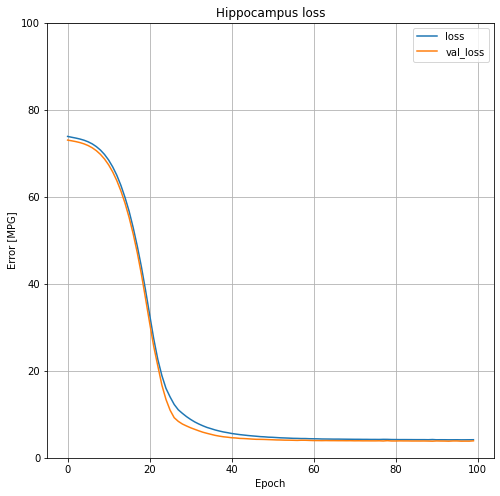

In [56]:
plot_loss(history, 0, "Hippocampus")

If you plot the predictions as a function of `hippocampus`, you'll see how this model takes advantage of the nonlinearity provided by the hidden layers:

In [57]:
x = tf.linspace(3000.0, 11000, 100)
y = dnn_hippocampus_model.predict(x)
# print(x)
# print(y)

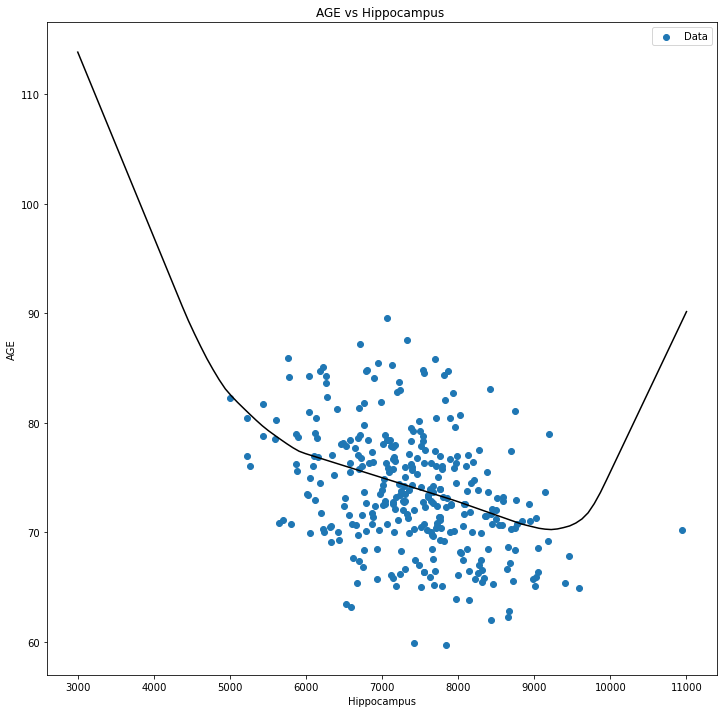

In [58]:
plot_feature(x, y, "Hippocampus", "AGE", TRAIN_FEATURES, TRAIN_LABELS, 0)

Collect the results on the test set, for later:

In [59]:
test_results['dnn_hippocampus_model'] = dnn_hippocampus_model.evaluate(
    TEST_FEATURES['Hippocampus'], 
    TEST_LABELS["AGE"],
    verbose=0)

### A2. Full Model

If you repeat this process using all the inputs it slightly improves the performance on the validation dataset.

In [60]:
normalizer_feature = preprocessing.Normalization(axis=-1)
normalizer_feature.adapt(np.array(TRAIN_FEATURES))

#####

dnn_model = build_and_compile_model(normalizer_feature)
dnn_model.summary()

Model: "sequential_110"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
normalization_112 (Normaliza (None, 3)                 7         
_________________________________________________________________
dense_330 (Dense)            (None, 64)                256       
_________________________________________________________________
dense_331 (Dense)            (None, 64)                4160      
_________________________________________________________________
dense_332 (Dense)            (None, 1)                 65        
Total params: 4,488
Trainable params: 4,481
Non-trainable params: 7
_________________________________________________________________


In [61]:
%%time
history = dnn_model.fit(
    TRAIN_FEATURES, 
    TRAIN_LABELS["AGE"],
    validation_split=0.2,
    verbose=0, 
    epochs=100
)

Wall time: 3.23 s


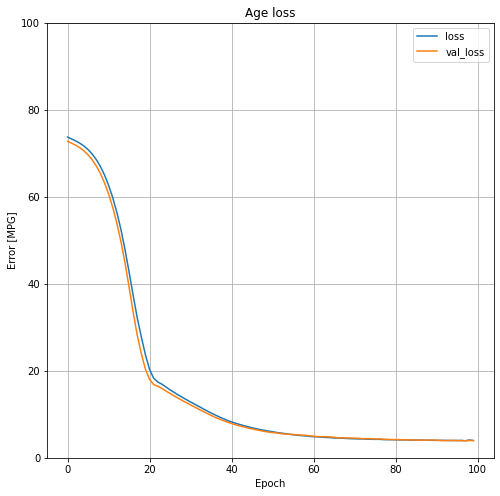

In [62]:
plot_loss(history, 0, "Age")

Collect the results on the test set:

In [63]:
test_results['dnn_model'] = dnn_model.evaluate(
    TEST_FEATURES, 
    TEST_LABELS["AGE"],
    verbose=0)

## B. Performance

Now that all the models are trained check the test-set performance and see how they did:

In [64]:
pd.set_option('display.max_rows', None)

pd.DataFrame(test_results, index=['Mean absolute error [AGE]']).T

,Mean absolute error [AGE]
FEATURE_Ventricles_LABEL_AGE_MODEL_model_1_hidden_0_dense_0_activation_none_DATASET_NL_EPOCH_10,7.290250e+01
FEATURE_Ventricles_LABEL_AGE_MODEL_model_1_hidden_0_dense_0_activation_none_DATASET_NL_EPOCH_100,6.570243e+01
FEATURE_Ventricles_LABEL_AGE_MODEL_model_1_hidden_0_dense_0_activation_none_DATASET_NL_EPOCH_200,5.770226e+01
FEATURE_Ventricles_LABEL_AGE_MODEL_model_2_hidden_2_dense_4_activation_relu_DATASET_NL_EPOCH_10,7.290250e+01
FEATURE_Ventricles_LABEL_AGE_MODEL_model_2_hidden_2_dense_4_activation_relu_DATASET_NL_EPOCH_100,4.164355e+00
FEATURE_Ventricles_LABEL_AGE_MODEL_model_2_hidden_2_dense_4_activation_relu_DATASET_NL_EPOCH_200,4.167828e+00
FEATURE_Ventricles_LABEL_AGE_MODEL_model_7_hidden_4_dense_64_activation_relu_DATASET_NL_EPOCH_10,4.202332e+00
FEATURE_Ventricles_LABEL_AGE_MODEL_model_7_hidden_4_dense_64_activation_relu_DATASET_NL_EPOCH_100,4.265931e+00
FEATURE_Ventricles_LABEL_AGE_MODEL_model_7_hidden_4_dense_64_activation_relu_DATASET_NL_EPOCH_200,4.128427e+00
FEATURE_Hippocampus_LABEL_AGE_MODEL_model_1_hidden_0_dense_0_activation_none_DATASET_NL_EPOCH_10,7.290250e+01


These results match the validation error seen during training.

## C. Make Predictions

Finally, predict have a look at the errors made by the model when making predictions on the test set:

Text(0, 0.5, 'Predictions [AGE]')

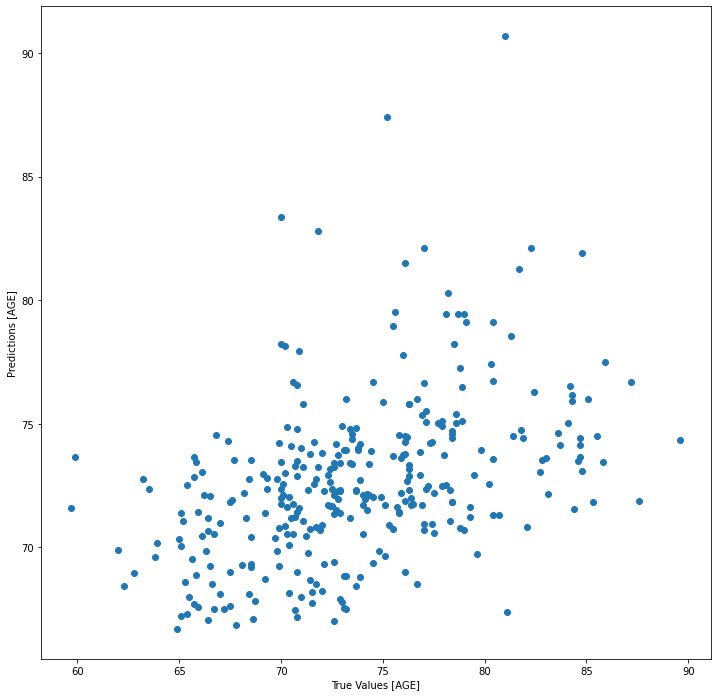

In [65]:
# test_predictions = dnn_model.predict(test_features).flatten()

# a = plt.axes(aspect='equal')
# plt.scatter(test_labels, test_predictions)
# plt.xlabel('True Values [AGE]')
# plt.ylabel('Predictions [AGE]')
# lims = [60, 90]
# plt.xlim(lims)
# plt.ylim(lims)
# _ = plt.plot(lims, lims)

##########

test_predictions = dnn_model.predict(TEST_FEATURES).flatten()

# a = plt.axes(aspect='equal')

plt.figure(figsize=(12, 12))
plt.scatter(TEST_LABELS["AGE"], 
            test_predictions)
plt.xlabel('True Values [AGE]')
plt.ylabel('Predictions [AGE]')

# lims = [60, 90]
# plt.xlim(lims)
# plt.ylim(lims)
# _ = plt.plot(lims, lims)


It looks like the model predicts reasonably well. 

Now take a look at the error distribution:

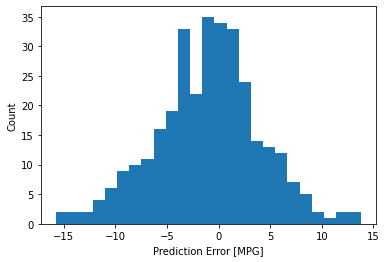

In [66]:
# error = test_predictions - test_labels

error = test_predictions - TEST_LABELS["AGE"]
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [MPG]')
_ = plt.ylabel('Count')

If you're happy with the model save it for later use:

In [67]:
dnn_model.save('dnn_model')

INFO:tensorflow:Assets written to: dnn_model\assets


If you reload the model, it gives identical output:

In [68]:
reloaded = tf.keras.models.load_model('dnn_model')

test_results['reloaded'] = reloaded.evaluate(
    TEST_FEATURES, 
    TEST_LABELS, 
    verbose=0)

In [69]:
pd.DataFrame(test_results, index=['Mean absolute error [MPG]']).T

,Mean absolute error [MPG]
FEATURE_Ventricles_LABEL_AGE_MODEL_model_1_hidden_0_dense_0_activation_none_DATASET_NL_EPOCH_10,7.290250e+01
FEATURE_Ventricles_LABEL_AGE_MODEL_model_1_hidden_0_dense_0_activation_none_DATASET_NL_EPOCH_100,6.570243e+01
FEATURE_Ventricles_LABEL_AGE_MODEL_model_1_hidden_0_dense_0_activation_none_DATASET_NL_EPOCH_200,5.770226e+01
FEATURE_Ventricles_LABEL_AGE_MODEL_model_2_hidden_2_dense_4_activation_relu_DATASET_NL_EPOCH_10,7.290250e+01
FEATURE_Ventricles_LABEL_AGE_MODEL_model_2_hidden_2_dense_4_activation_relu_DATASET_NL_EPOCH_100,4.164355e+00
FEATURE_Ventricles_LABEL_AGE_MODEL_model_2_hidden_2_dense_4_activation_relu_DATASET_NL_EPOCH_200,4.167828e+00
FEATURE_Ventricles_LABEL_AGE_MODEL_model_7_hidden_4_dense_64_activation_relu_DATASET_NL_EPOCH_10,4.202332e+00
FEATURE_Ventricles_LABEL_AGE_MODEL_model_7_hidden_4_dense_64_activation_relu_DATASET_NL_EPOCH_100,4.265931e+00
FEATURE_Ventricles_LABEL_AGE_MODEL_model_7_hidden_4_dense_64_activation_relu_DATASET_NL_EPOCH_200,4.128427e+00
FEATURE_Hippocampus_LABEL_AGE_MODEL_model_1_hidden_0_dense_0_activation_none_DATASET_NL_EPOCH_10,7.290250e+01


# Conclusion

This notebook introduced a few techniques to handle a regression problem. Here are a few more tips that may help:

* [Mean Squared Error (MSE)](https://www.tensorflow.org/api_docs/python/tf/losses/MeanSquaredError) and [Mean Absolute Error (MAE)](https://www.tensorflow.org/api_docs/python/tf/losses/MeanAbsoluteError) are common loss functions used for regression problems. Mean Absolute Error is less sensitive to outliers. Different loss functions are used for classification problems.
* Similarly, evaluation metrics used for regression differ from classification.
* When numeric input data features have values with different ranges, each feature should be scaled independently to the same range.
* Overfitting is a common problem for DNN models, it wasn't a problem for this tutorial. See the [overfit and underfit](overfit_and_underfit.ipynb) tutorial for more help with this.
